# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 


Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [3]:
!pip install plotnine
 

In [4]:
def display_cluster(X, km=[], num_clusters=0):
    color = ['b', 'r', 'g', 'c', 'm', 'y', 'k']  # List of colors
    alpha = 0.5  # Color opacity
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:, 0], X[:, 1], c=color[0], alpha=alpha, s=s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_ == i, 0], X[km.labels_ == i, 1], c=color[i % len(color)], alpha=alpha, s=s)
            plt.scatter(km.cluster_centers_[i][0], km.cluster_centers_[i][1], c=color[i % len(color)], marker='x', s=100)


## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



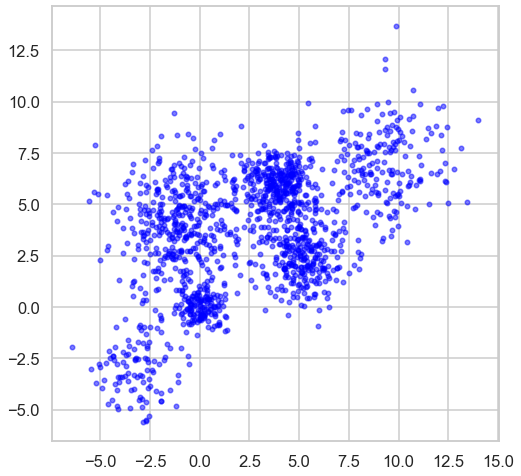

In [5]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [6]:
!pip install kneed


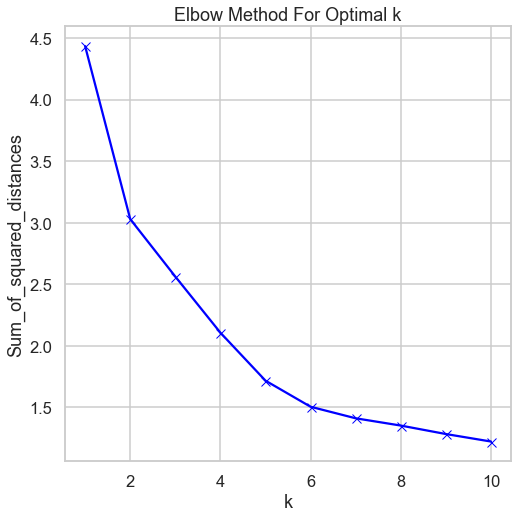

5


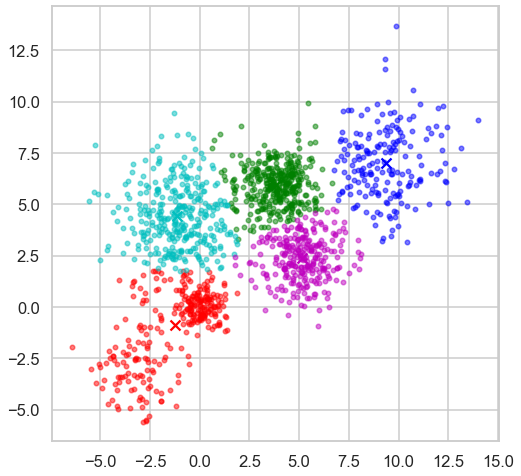

In [7]:
from sklearn.cluster import KMeans
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cdist

inertia = []
K = range(1,11)
for k in K:
    km = KMeans(n_clusters=k,random_state=42,max_iter=50)
    km.fit(Multi_blob_Data)
    inertia.append(sum(np.min(cdist(Multi_blob_Data,
    km.cluster_centers_, 'euclidean'),axis=1)) /
    Multi_blob_Data.shape[0])

#Plotting the inertia result to find the elbow
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

#finding the elbow using kneed locator
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), inertia, curve="convex", direction="decreasing")
best_cluster= kl.elbow
print(best_cluster)

#Displaying the best cluster
km_new= KMeans(n_clusters= best_cluster)
km_new.fit(Multi_blob_Data)
display_cluster(Multi_blob_Data, km_new, best_cluster)


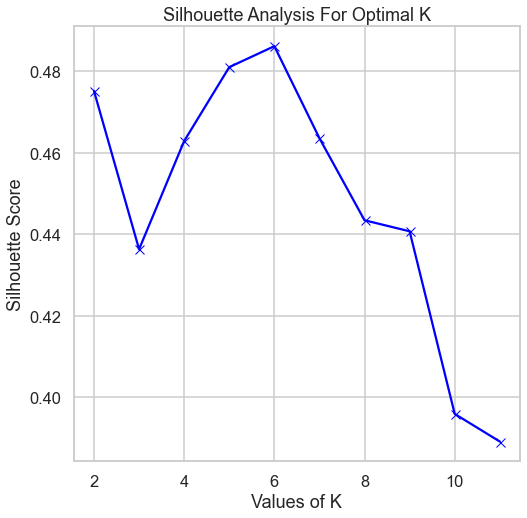

Best K value: 6
Best Silhouette Score: 0.48614459735646176


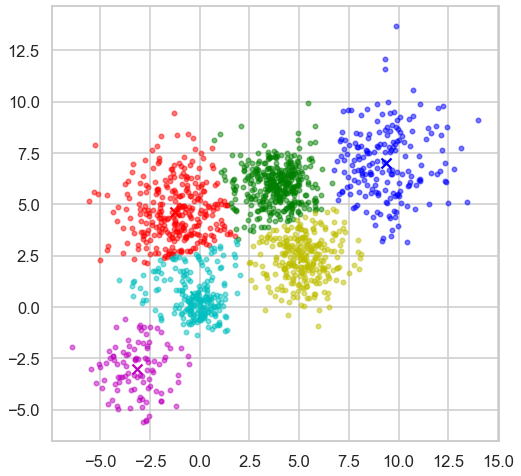

In [8]:
from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
silhouette_avg = []
best_k = None
best_silhouette_score = -1  # Initialize with a low value

for num_clusters in range_n_clusters:
    # Initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,random_state=42,max_iter=50)
    kmeans.fit(Multi_blob_Data)
    cluster_labels = kmeans.labels_

    # Compute silhouette score
    silhouette_avg.append(silhouette_score(Multi_blob_Data, cluster_labels))

    # Check if current silhouette score is the highest so far
    if silhouette_avg[-1] > best_silhouette_score:
        best_silhouette_score = silhouette_avg[-1]
        best_k = num_clusters

plt.plot(range_n_clusters, silhouette_avg, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis For Optimal K')
plt.show()

print("Best K value:", best_k)
print("Best Silhouette Score:", best_silhouette_score)

#Displaying the best cluster
km_neww= KMeans(n_clusters= best_k)
km_neww.fit(Multi_blob_Data)
display_cluster(Multi_blob_Data, km_neww, best_k)


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc

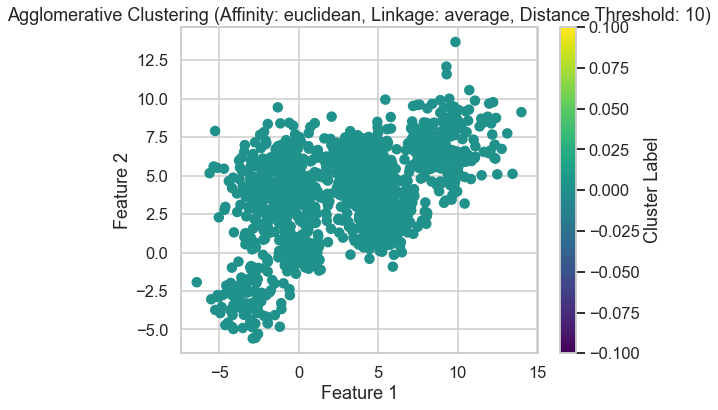

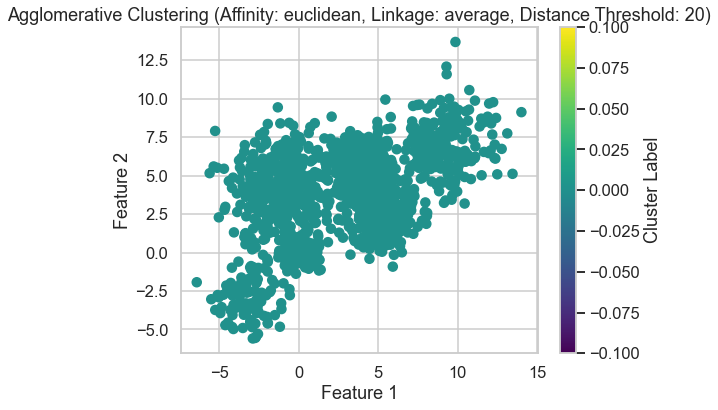

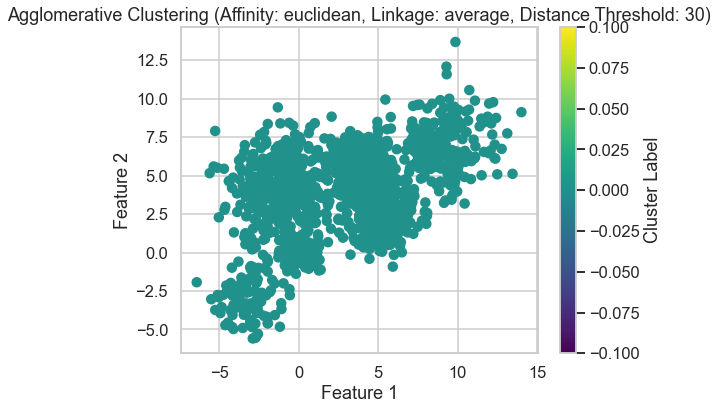

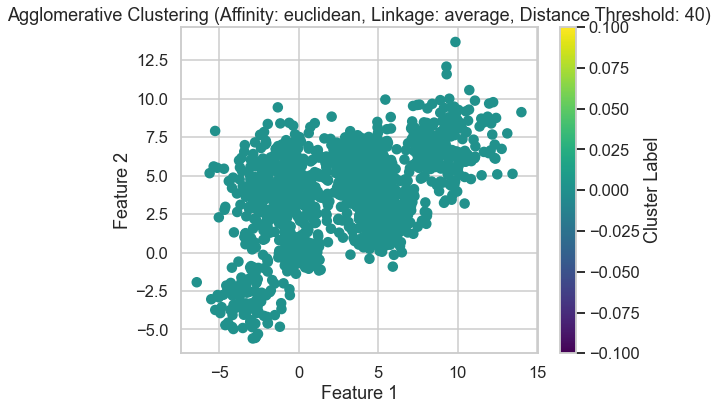

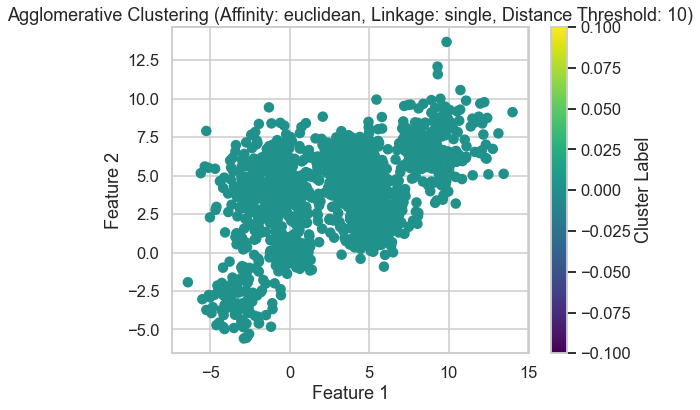

...

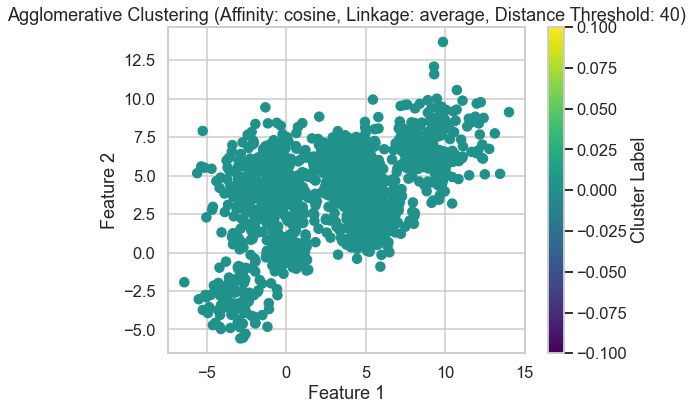

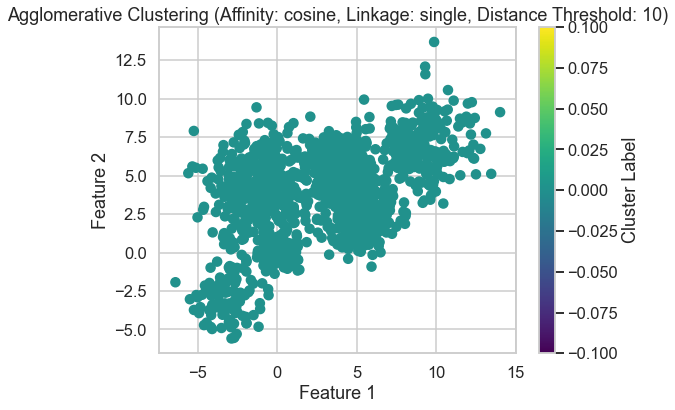

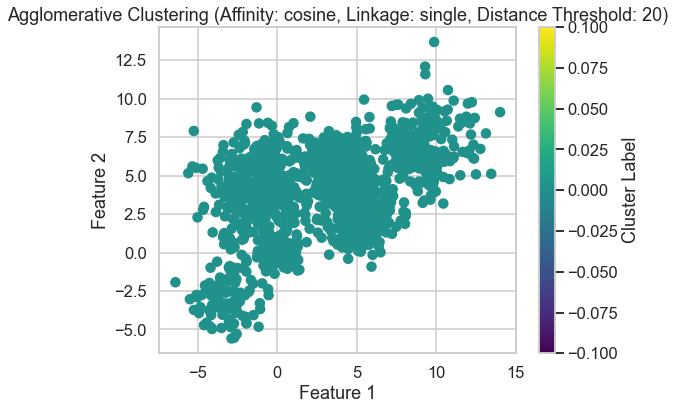

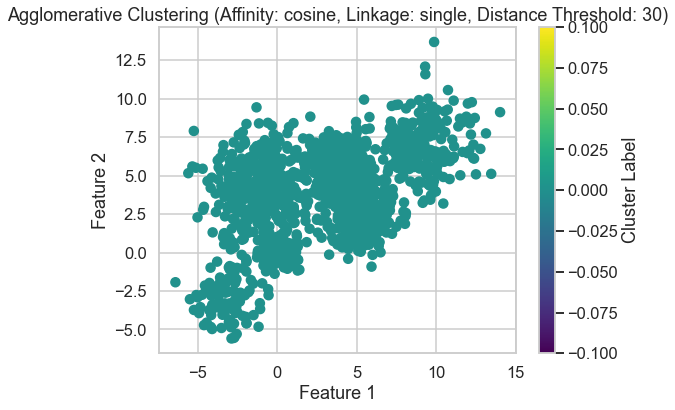

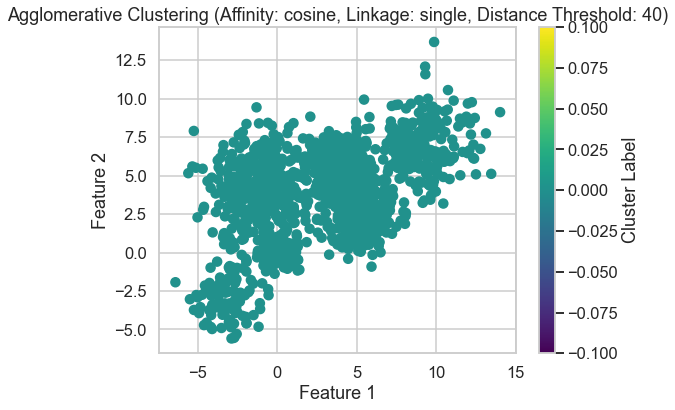

In [10]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20,30,40]  

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(Multi_blob_Data)

            # Plot the clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
            plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.colorbar(label='Cluster Label')
            plt.show()


Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 40


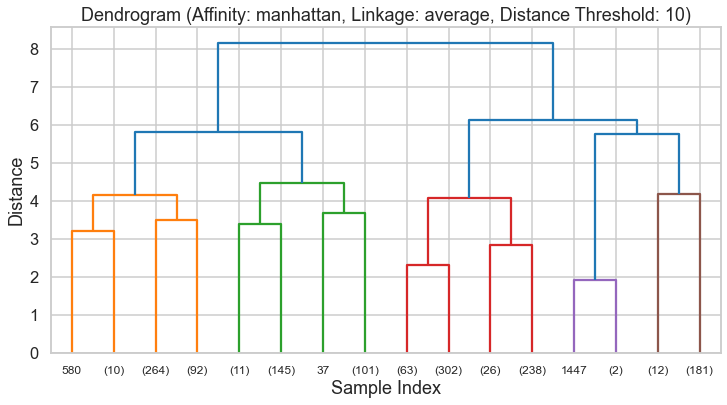

Silhouette Score: 0.46762361386512785


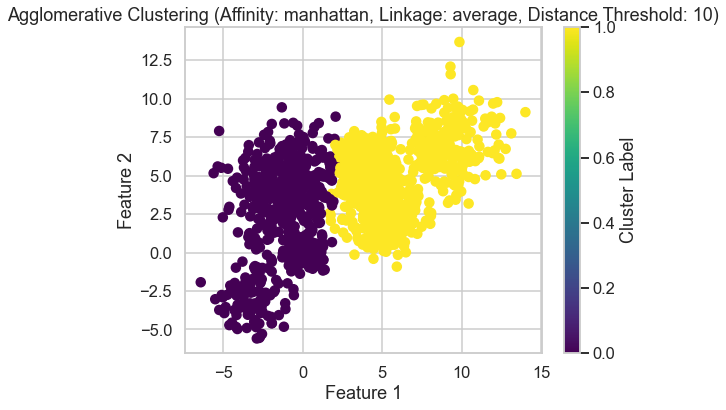

Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: cosine, Linkage: average, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters

In [11]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(Multi_blob_Data)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
            
                # Plot the dendrogram
                plt.figure(figsize=(12, 6))
                dendrogram = sch.dendrogram(sch.linkage(Multi_blob_Data, method=linkage), truncate_mode='level', p=3)
                plt.title(f'Dendrogram (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Sample Index')
                plt.ylabel('Distance')
                plt.show()
                
                # Calculate silhouette score
                silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
                print(f'Silhouette Score: {silhouette_avg}')
                
                # Plot the clusters
                plt.figure(figsize=(8, 6))
                plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
                plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Feature 1')
                plt.ylabel('Feature 2')
                plt.colorbar(label='Cluster Label')
                plt.show()
            else:
                print(f'Number of clusters formed is less than 2 for parameters: Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold}')


In [12]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(Multi_blob_Data)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
                # Calculate silhouette score
                silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
                
                # Check if silhouette score is better than current best
                if silhouette_avg > best_silhouette_score:
                    best_silhouette_score = silhouette_avg
                    best_params = {'affinity': affinity, 'linkage': linkage, 'distance_threshold': distance_threshold}
                
# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: 0.46762361386512785
Best Parameters: {'affinity': 'manhattan', 'linkage': 'average', 'distance_threshold': 10}


In [13]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Define different values for parameters
eps_values = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
min_samples_values = [5, 10, 15, 20, 25]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(Multi_blob_Data)
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
            
            # Check if silhouette score is better than current best
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params = {'eps': eps, 'min_samples': min_samples}

# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: 0.4685207355522043
Best Parameters: {'eps': 2.5, 'min_samples': 15}


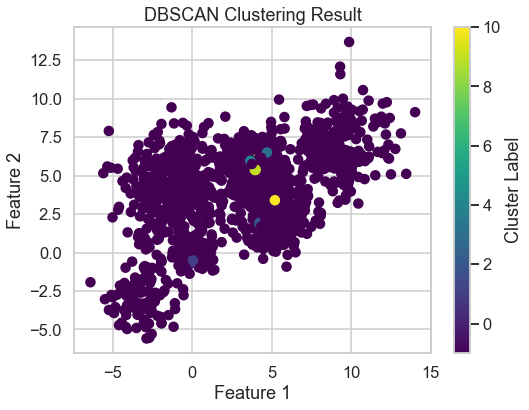

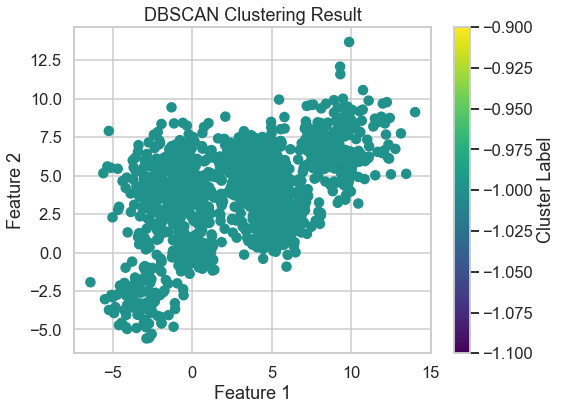

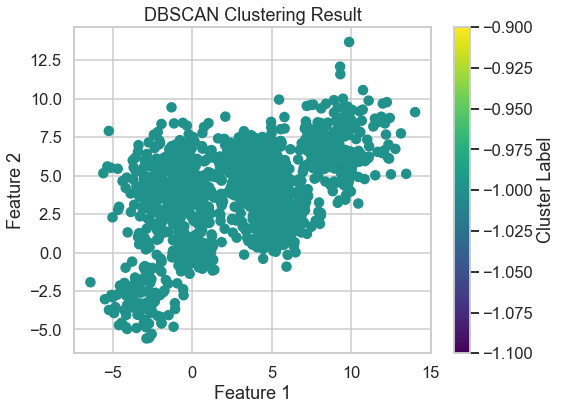

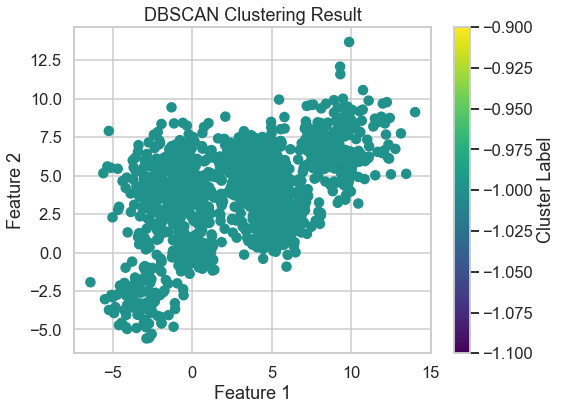

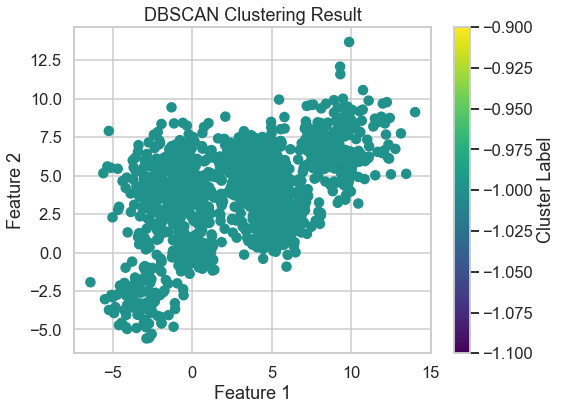

...

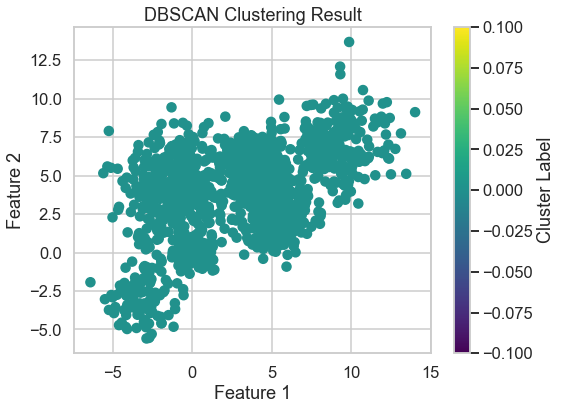

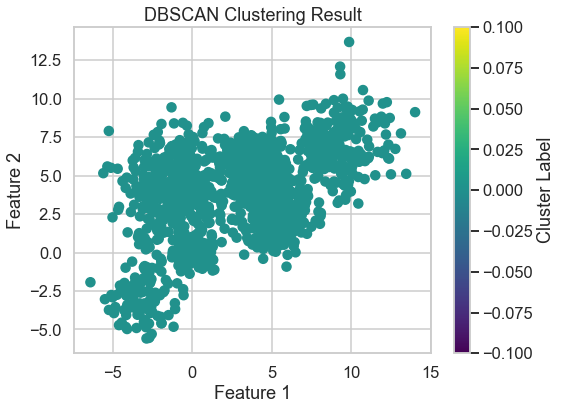

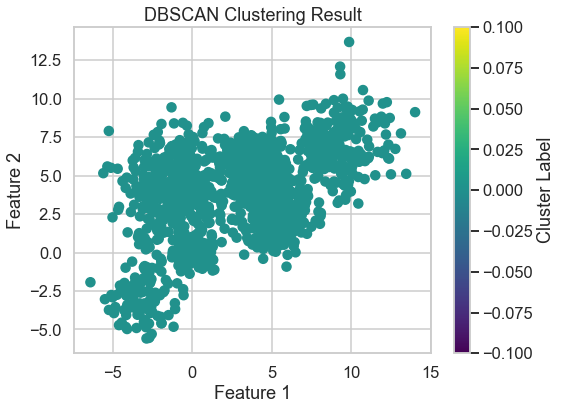

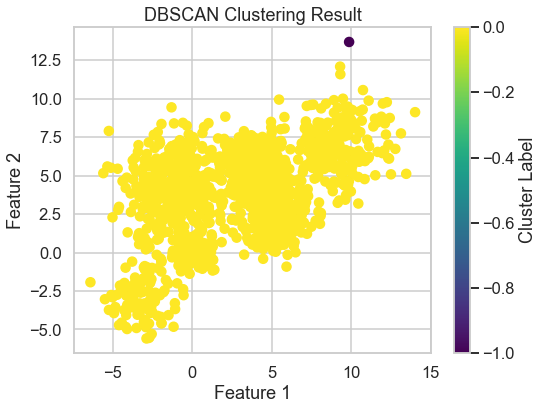

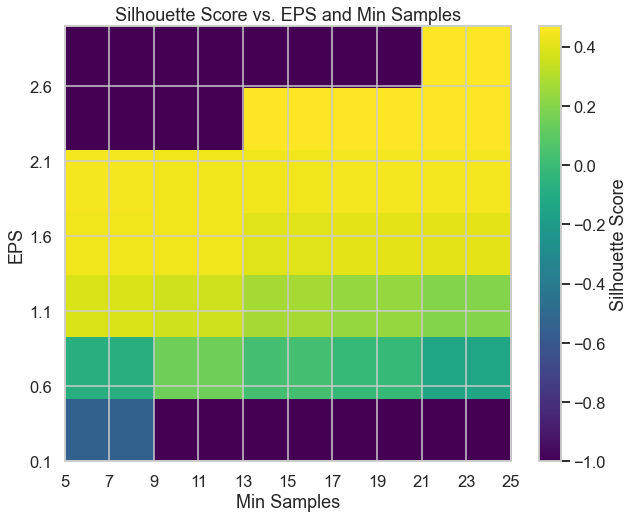

Best EPS: 2.5
Best Min Samples: 15


In [14]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Define different values for parameters
eps_values =  [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0] 
min_samples_values = [5, 10, 15, 20, 25]  

# Initialize lists to store silhouette scores
silhouette_scores = []
best_eps = None
best_min_samples = None
best_silhouette_score = float('-inf')

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(Multi_blob_Data)
        
        # Plot the resulting clusters
        plt.figure(figsize=(8, 6))
        plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
        plt.title('DBSCAN Clustering Result')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.colorbar(label='Cluster Label')
        plt.show()
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
            silhouette_scores.append(silhouette_avg)
            
            # Update best silhouette score and corresponding parameters
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
        else:
            # Assign default value if only one cluster is formed
            silhouette_scores.append(-1)

# Reshape silhouette scores into a 2D array for plotting
silhouette_scores = np.array(silhouette_scores).reshape(len(eps_values), len(min_samples_values))

# Plot silhouette scores
plt.figure(figsize=(10, 8))
plt.imshow(silhouette_scores, cmap='viridis', origin='lower', extent=[5, 25, 0.1, 3.0], aspect='auto')
plt.colorbar(label='Silhouette Score')
plt.xlabel('Min Samples')
plt.ylabel('EPS')
plt.title('Silhouette Score vs. EPS and Min Samples')
plt.xticks(range(5, 26, 2))
plt.yticks(np.arange(0.1, 3.1, 0.5))
plt.grid(visible=True)
plt.show()



# Print the best values of eps and min_samples
print(f'Best EPS: {best_eps}')
print(f'Best Min Samples: {best_min_samples}')


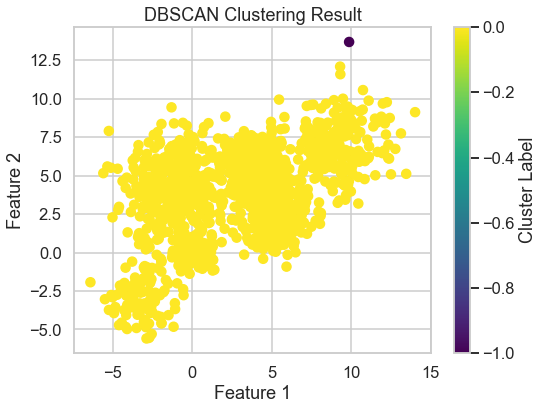

In [15]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Perform DBSCAN clustering with the best parameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan.fit_predict(Multi_blob_Data)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

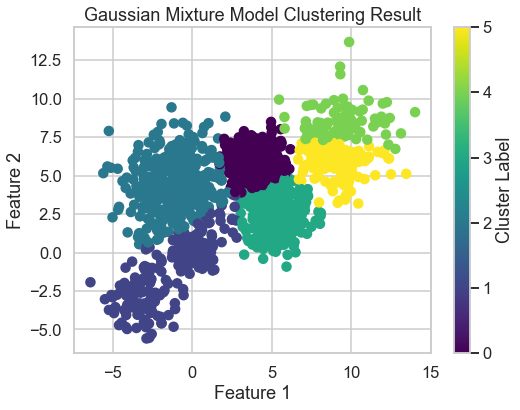

In [16]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Define the number of clusters
n_clusters = 6  # You can change this as needed

# Fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
cluster_labels = gmm.fit_predict(Multi_blob_Data)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
plt.title('Gaussian Mixture Model Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


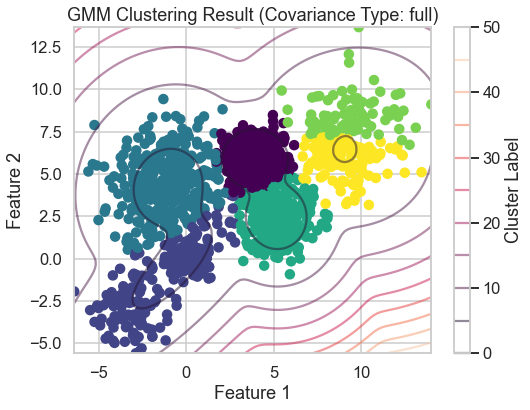

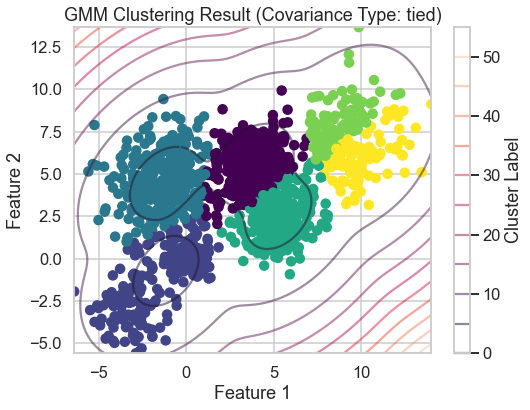

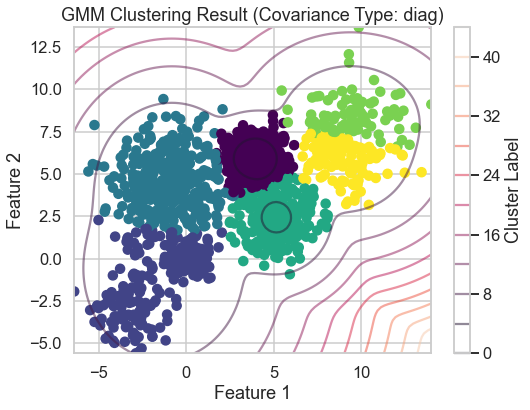

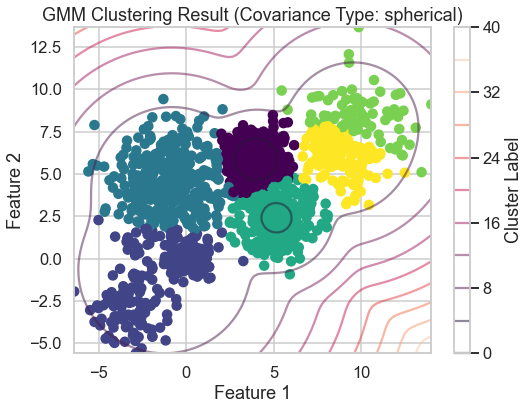

In [17]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
import numpy as np
import matplotlib.pyplot as plt

# Define the number of clusters
n_clusters = 6  # You can change this as needed

# Define different covariance types
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Plot the resulting clusters for each covariance type
for covariance_type in covariance_types:
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, random_state=42)
    cluster_labels = gmm.fit_predict(Multi_blob_Data)
    
    # Plot the resulting clusters with probability density contours
    plt.figure(figsize=(8, 6))
    plt.title(f'GMM Clustering Result (Covariance Type: {covariance_type})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    
    # Plot data points
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
    
    # Plot probability density contours
    x = np.linspace(np.min(Multi_blob_Data[:, 0]), np.max(Multi_blob_Data[:, 0]), 100)
    y = np.linspace(np.min(Multi_blob_Data[:, 1]), np.max(Multi_blob_Data[:, 1]), 100)
    X, Y = np.meshgrid(x, y)
    XX = np.array([X.ravel(), Y.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X.shape)
    plt.contour(X, Y, Z, levels=10, alpha=0.5)

    plt.colorbar(label='Cluster Label')
    plt.show()


## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [18]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']

# Display feature data (X)
print("Feature data (X):")
print(iris_data.data[:10])  # Display the first 5 rows

# Display target data (y)
print("\nTarget data (y):")
print(iris_data.target[:10])  # Display the first 5 rows

# View unique values of the target
unique_target_values = np.unique(iris_data.target)
print("Unique values of the target:", unique_target_values)



Feature data (X):
[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]]

Target data (y):
[0 0 0 0 0 0 0 0 0 0]
Unique values of the target: [0 1 2]


* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

KMEANS


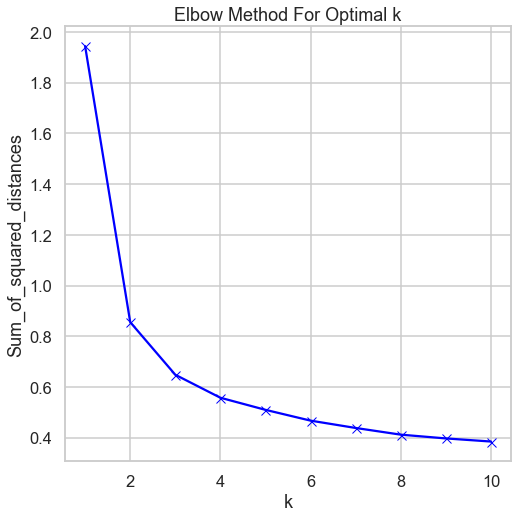

3


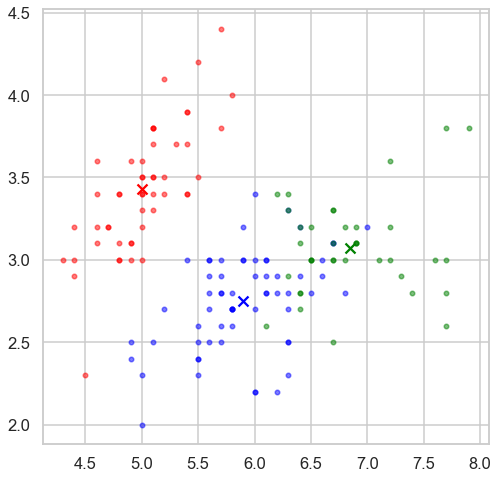

In [19]:
from sklearn.cluster import KMeans
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cdist
# Extract the feature data (X)
X = iris_data.data
inertia = []
K = range(1,11)
for k in K:
    km = KMeans(n_clusters=k,random_state=42,max_iter=50)
    km.fit(X)
    inertia.append(sum(np.min(cdist(X,
    km.cluster_centers_, 'euclidean'),axis=1)) /
    X.shape[0])

#Plotting the inertia result to find the elbow
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

#finding the elbow using kneed locator
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), inertia, curve="convex", direction="decreasing")
best_cluster= kl.elbow
print(best_cluster)

#Displaying the best cluster
km_new= KMeans(n_clusters= best_cluster)
km_new.fit(X)
display_cluster(X, km_new, best_cluster)


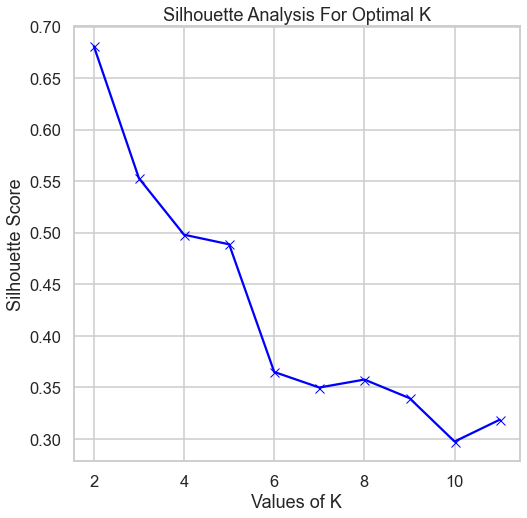

Best K value: 2
Best Silhouette Score: 0.6810461692117462


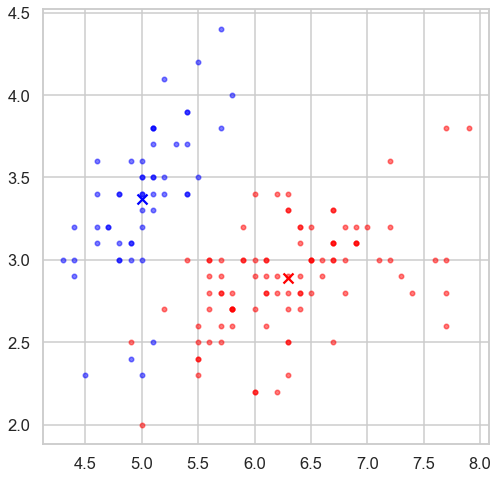

In [20]:
from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
silhouette_avg = []
best_k = None
best_silhouette_score = -1  # Initialize with a low value

for num_clusters in range_n_clusters:
    # Initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,random_state=42,max_iter=50)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_

    # Compute silhouette score
    silhouette_avg.append(silhouette_score(X, cluster_labels))

    # Check if current silhouette score is the highest so far
    if silhouette_avg[-1] > best_silhouette_score:
        best_silhouette_score = silhouette_avg[-1]
        best_k = num_clusters

plt.plot(range_n_clusters, silhouette_avg, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis For Optimal K')
plt.show()

print("Best K value:", best_k)
print("Best Silhouette Score:", best_silhouette_score)

#Displaying the best cluster
km_neww= KMeans(n_clusters= best_k)
km_neww.fit(X)
display_cluster(X, km_neww, best_k)


hierarchical clustering 

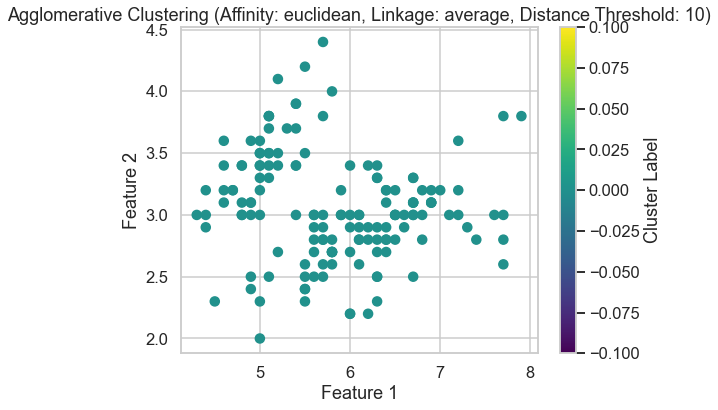

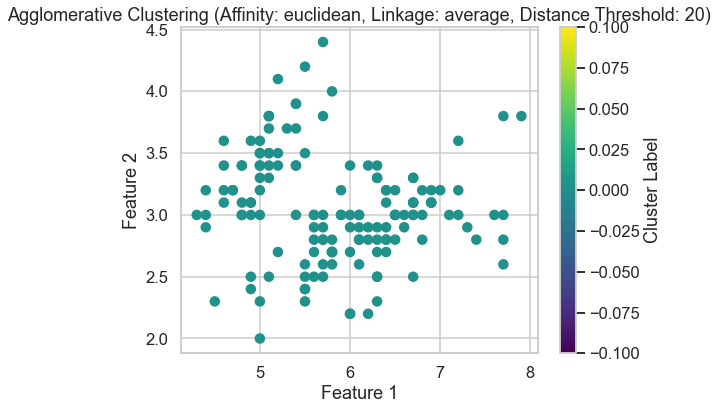

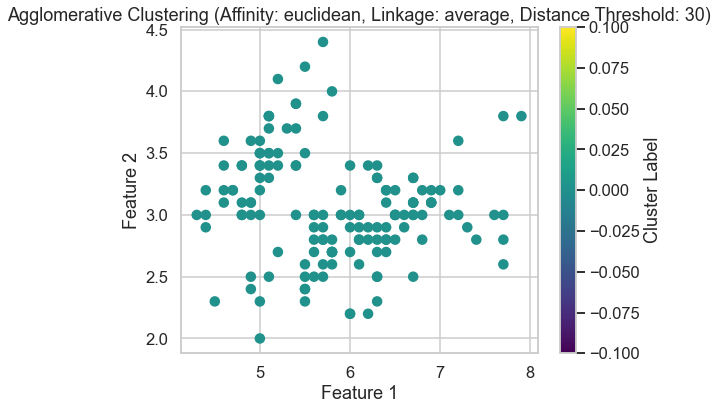

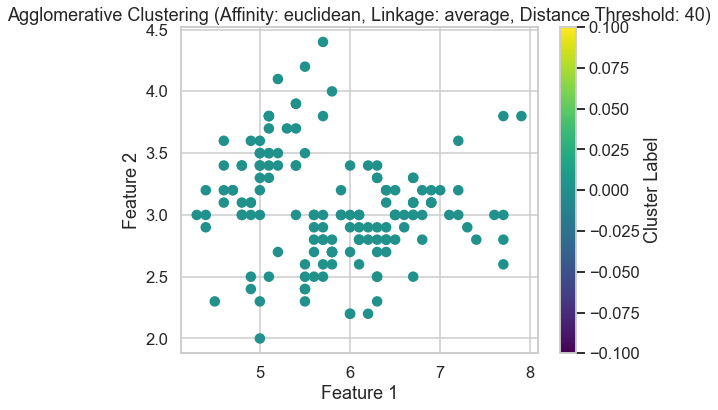

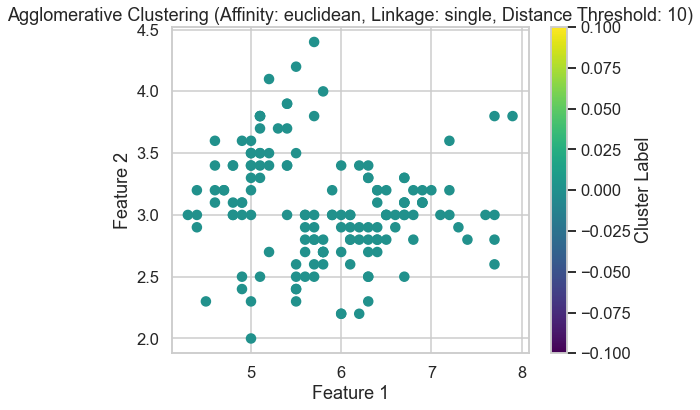

...

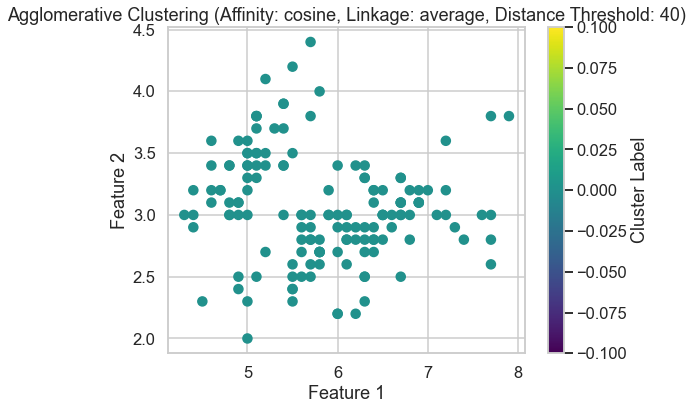

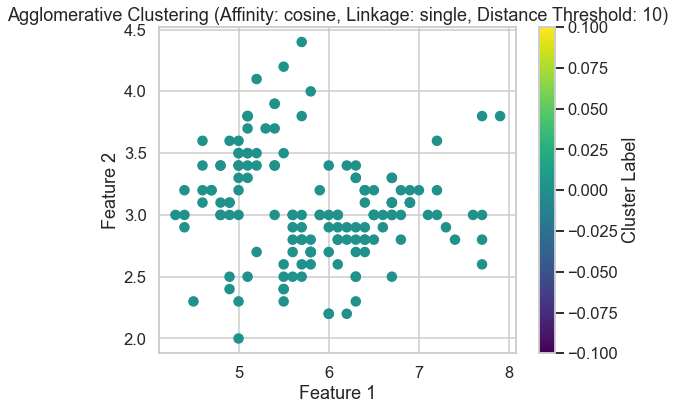

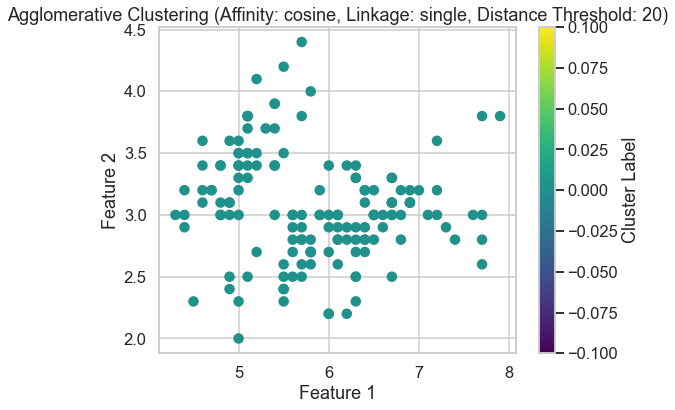

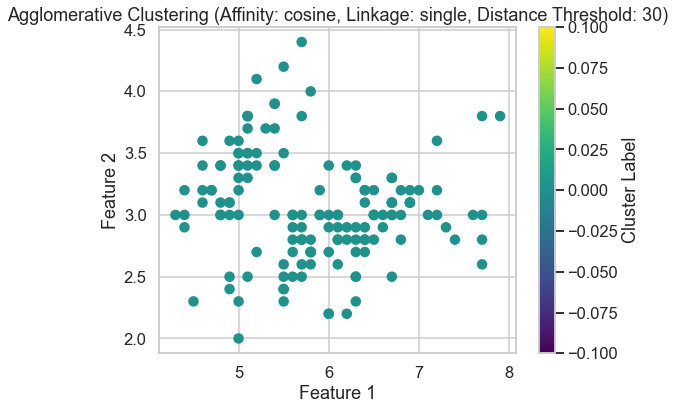

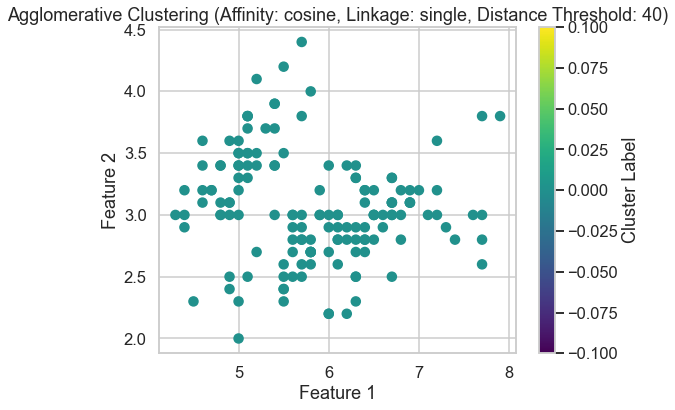

In [21]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20,30,40]  

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(X)

            # Plot the clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis')
            plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.colorbar(label='Cluster Label')
            plt.show()


Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 40


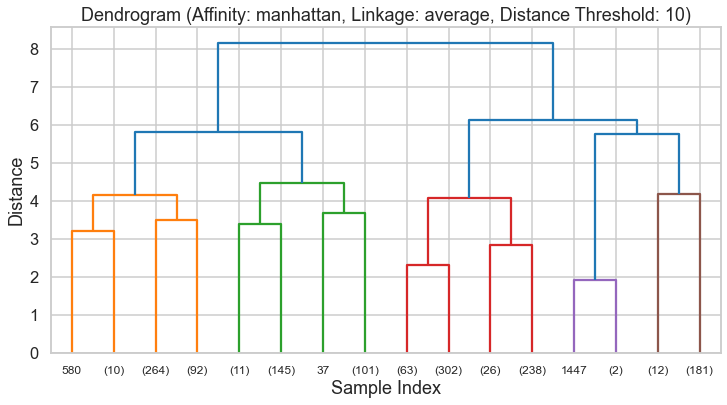

Silhouette Score: 0.46762361386512785


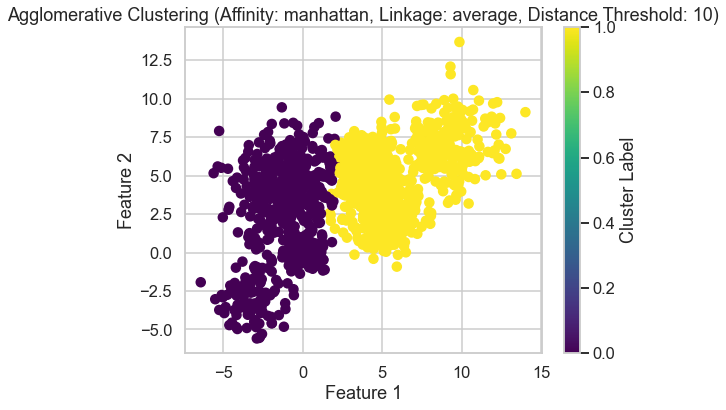

Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: cosine, Linkage: average, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters

In [22]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(Multi_blob_Data)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
            
                # Plot the dendrogram
                plt.figure(figsize=(12, 6))
                dendrogram = sch.dendrogram(sch.linkage(Multi_blob_Data, method=linkage), truncate_mode='level', p=3)
                plt.title(f'Dendrogram (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Sample Index')
                plt.ylabel('Distance')
                plt.show()
                
                # Calculate silhouette score
                silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
                print(f'Silhouette Score: {silhouette_avg}')
                
                # Plot the clusters
                plt.figure(figsize=(8, 6))
                plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=cluster_labels, cmap='viridis')
                plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Feature 1')
                plt.ylabel('Feature 2')
                plt.colorbar(label='Cluster Label')
                plt.show()
            else:
                print(f'Number of clusters formed is less than 2 for parameters: Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold}')


In [23]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(X)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
                # Calculate silhouette score
                silhouette_avg = silhouette_score(X, cluster_labels)
                
                # Check if silhouette score is better than current best
                if silhouette_avg > best_silhouette_score:
                    best_silhouette_score = silhouette_avg
                    best_params = {'affinity': affinity, 'linkage': linkage, 'distance_threshold': distance_threshold}
                
# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: -inf
Best Parameters: {}


DBSCAN

In [24]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Define different values for parameters
eps_values = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
min_samples_values = [5, 10, 15, 20, 25]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(X)
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(X, cluster_labels)
            
            # Check if silhouette score is better than current best
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params = {'eps': eps, 'min_samples': min_samples}

# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: 0.6867350732769776
Best Parameters: {'eps': 1.0, 'min_samples': 5}


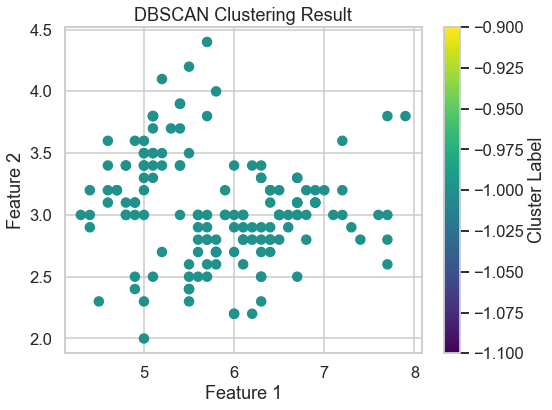

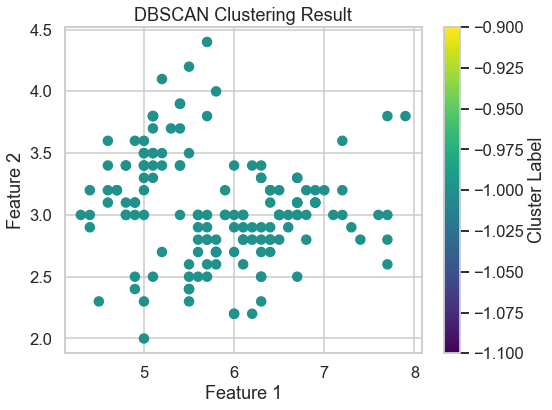

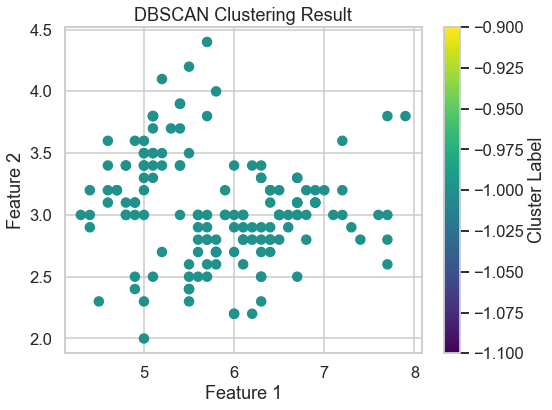

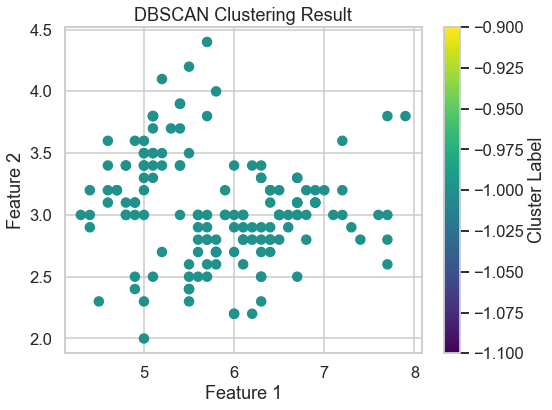

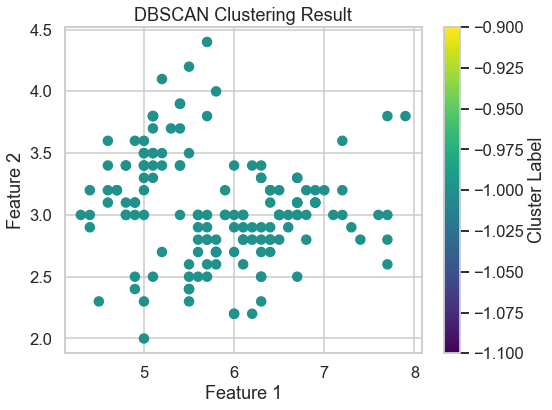

...

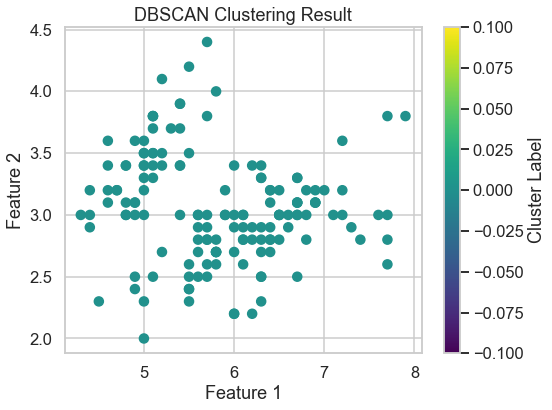

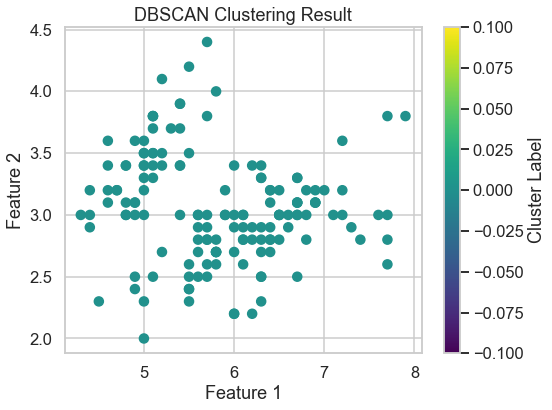

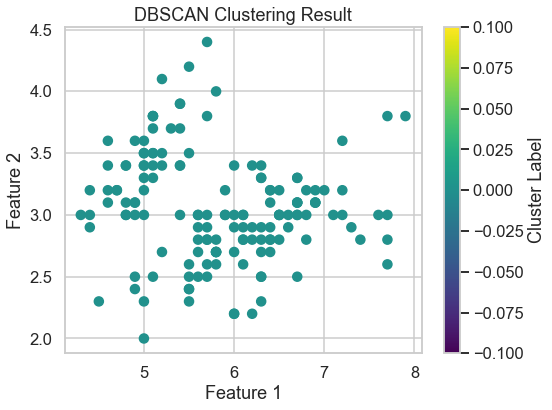

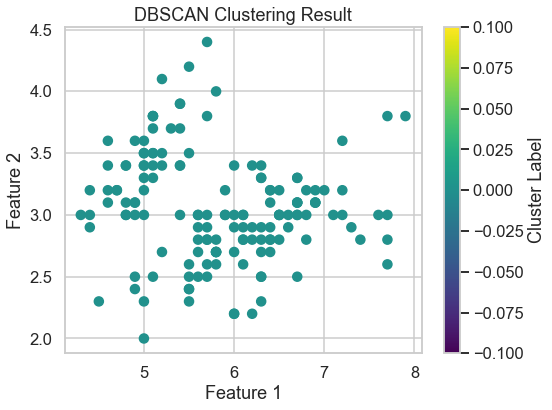

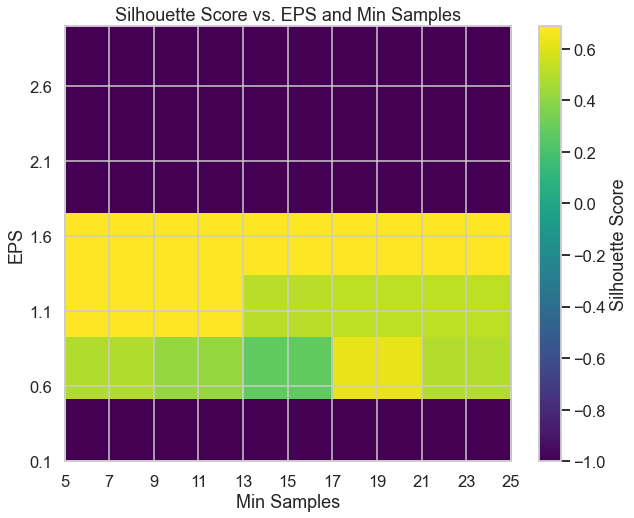

Best EPS: 1.0
Best Min Samples: 5


In [25]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Define different values for parameters
eps_values =  [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0] 
min_samples_values = [5, 10, 15, 20, 25]  

# Initialize lists to store silhouette scores
silhouette_scores = []
best_eps = None
best_min_samples = None
best_silhouette_score = float('-inf')

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(X)
        
        # Plot the resulting clusters
        plt.figure(figsize=(8, 6))
        plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis')
        plt.title('DBSCAN Clustering Result')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.colorbar(label='Cluster Label')
        plt.show()
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(X, cluster_labels)
            silhouette_scores.append(silhouette_avg)
            
            # Update best silhouette score and corresponding parameters
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
        else:
            # Assign default value if only one cluster is formed
            silhouette_scores.append(-1)

# Reshape silhouette scores into a 2D array for plotting
silhouette_scores = np.array(silhouette_scores).reshape(len(eps_values), len(min_samples_values))

# Plot silhouette scores
plt.figure(figsize=(10, 8))
plt.imshow(silhouette_scores, cmap='viridis', origin='lower', extent=[5, 25, 0.1, 3.0], aspect='auto')
plt.colorbar(label='Silhouette Score')
plt.xlabel('Min Samples')
plt.ylabel('EPS')
plt.title('Silhouette Score vs. EPS and Min Samples')
plt.xticks(range(5, 26, 2))
plt.yticks(np.arange(0.1, 3.1, 0.5))
plt.grid(visible=True)
plt.show()



# Print the best values of eps and min_samples
print(f'Best EPS: {best_eps}')
print(f'Best Min Samples: {best_min_samples}')


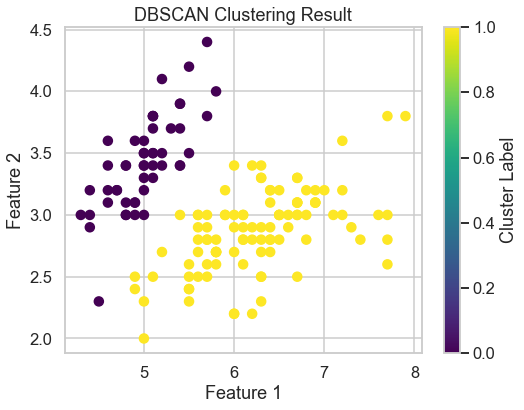

In [26]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Perform DBSCAN clustering with the best parameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan.fit_predict(X)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


Gaussian Mixture 

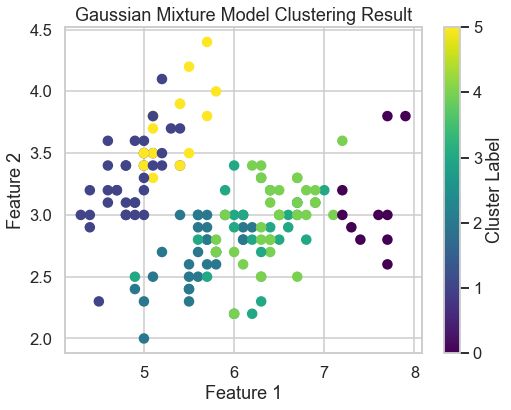

In [27]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Define the number of clusters
n_clusters = 6  # You can change this as needed

# Fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
cluster_labels = gmm.fit_predict(X)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis')
plt.title('Gaussian Mixture Model Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


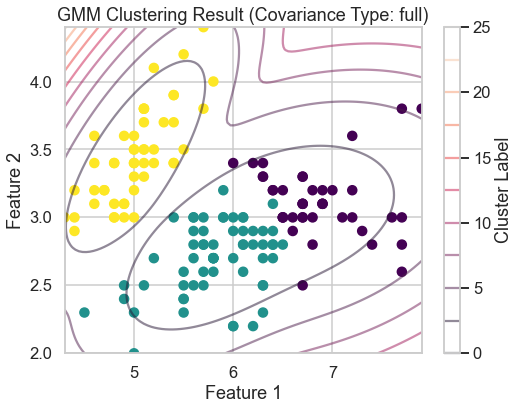

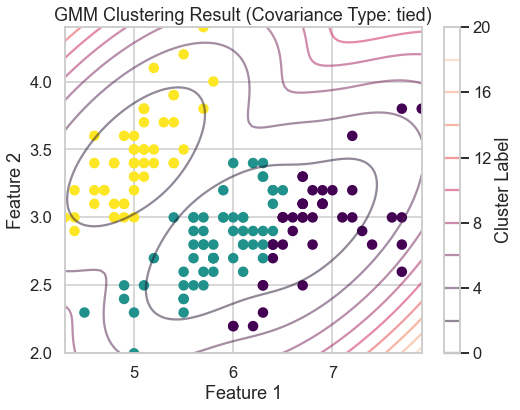

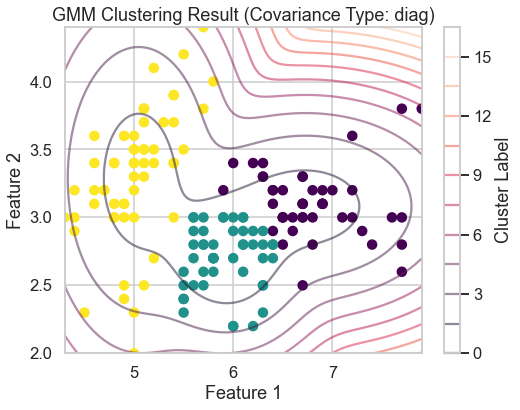

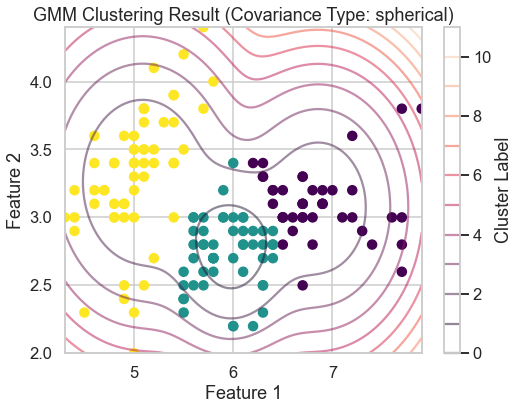

In [28]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import load_iris
import numpy as np
import matplotlib.pyplot as plt

# Load the Iris dataset
iris_data = load_iris()
X = iris_data.data[:, :2]  # Selecting only the first two features for visualization

# Define the number of clusters
n_clusters = 3  # Number of clusters in the Iris dataset

# Define different covariance types
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Plot the resulting clusters for each covariance type
for covariance_type in covariance_types:
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, random_state=42)
    cluster_labels = gmm.fit_predict(X)
    
    # Plot the resulting clusters with probability density contours
    plt.figure(figsize=(8, 6))
    plt.title(f'GMM Clustering Result (Covariance Type: {covariance_type})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    
    # Plot data points
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis')
    
    # Plot probability density contours
    x = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), 100)
    y = np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), 100)
    X_mesh, Y_mesh = np.meshgrid(x, y)
    XX = np.array([X_mesh.ravel(), Y_mesh.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X_mesh.shape)
    plt.contour(X_mesh, Y_mesh, Z, levels=10, alpha=0.5)

    plt.colorbar(label='Cluster Label')
    plt.show()


NORMALIZED DATA

KMEANS

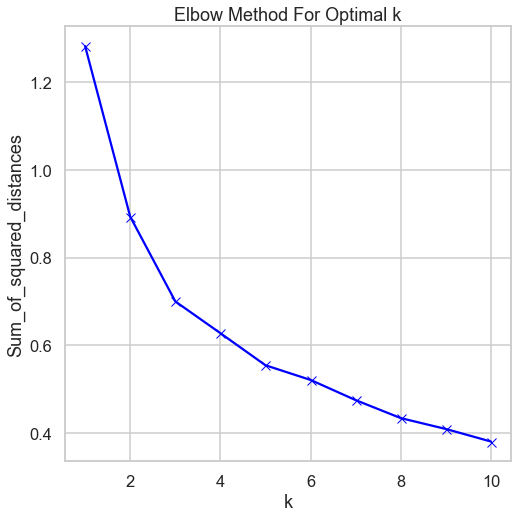

3


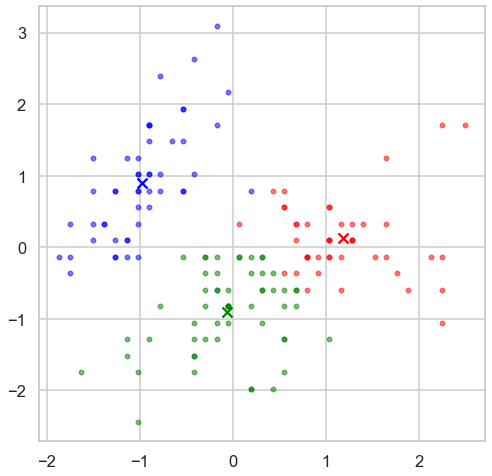

In [29]:
from sklearn.cluster import KMeans
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cdist

scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)
inertia = []
K = range(1,11)
for k in K:
    km = KMeans(n_clusters=k,random_state=42,max_iter=50)
    km.fit(X_normalized)
    inertia.append(sum(np.min(cdist(X_normalized,
    km.cluster_centers_, 'euclidean'),axis=1)) /
    X_normalized.shape[0])

#Plotting the inertia result to find the elbow
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

#finding the elbow using kneed locator
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), inertia, curve="convex", direction="decreasing")
best_cluster= kl.elbow
print(best_cluster)

#Displaying the best cluster
km_new= KMeans(n_clusters= best_cluster)
km_new.fit(X_normalized)
display_cluster(X_normalized, km_new, best_cluster)


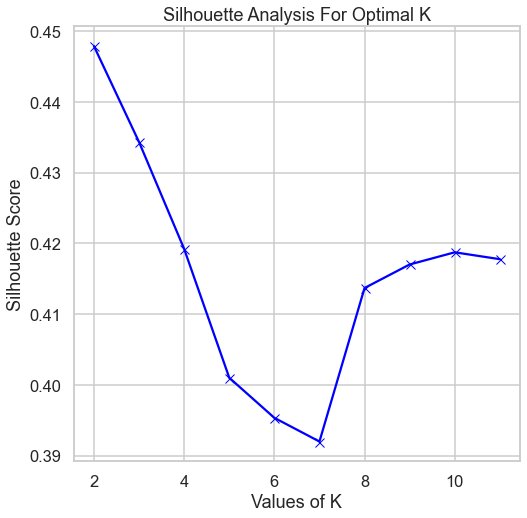

Best K value: 2
Best Silhouette Score: 0.44787107939731574


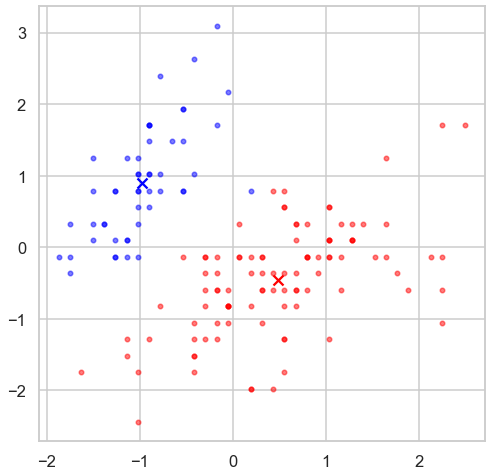

In [30]:
from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
silhouette_avg = []
best_k = None
best_silhouette_score = -1  # Initialize with a low value

for num_clusters in range_n_clusters:
    # Initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,random_state=42,max_iter=50)
    kmeans.fit(X_normalized)
    cluster_labels = kmeans.labels_

    # Compute silhouette score
    silhouette_avg.append(silhouette_score(X_normalized, cluster_labels))

    # Check if current silhouette score is the highest so far
    if silhouette_avg[-1] > best_silhouette_score:
        best_silhouette_score = silhouette_avg[-1]
        best_k = num_clusters

plt.plot(range_n_clusters, silhouette_avg, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis For Optimal K')
plt.show()

print("Best K value:", best_k)
print("Best Silhouette Score:", best_silhouette_score)

#Displaying the best cluster
km_neww= KMeans(n_clusters= best_k)
km_neww.fit(X_normalized)
display_cluster(X_normalized, km_neww, best_k)


hierarchical clustering

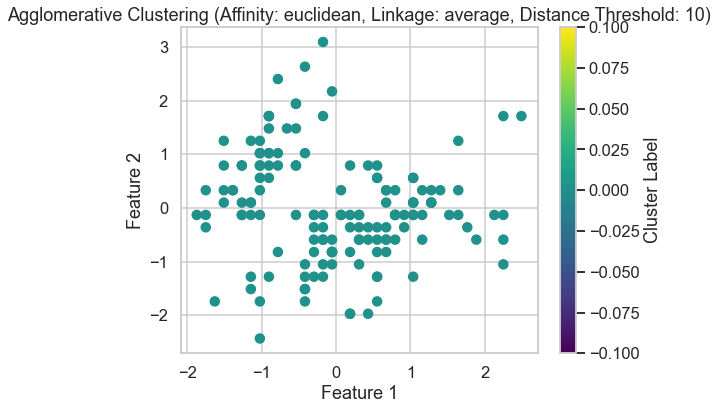

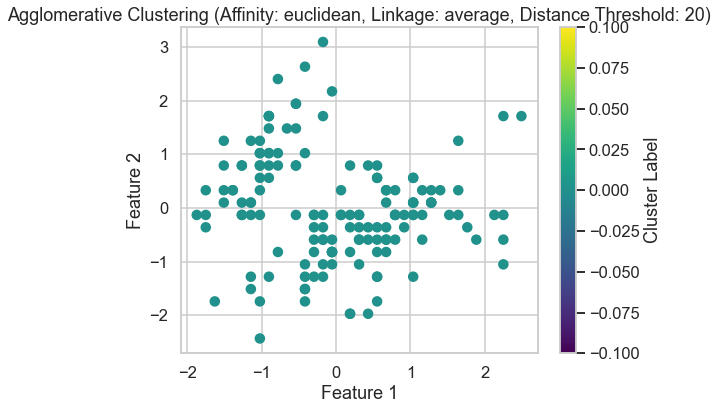

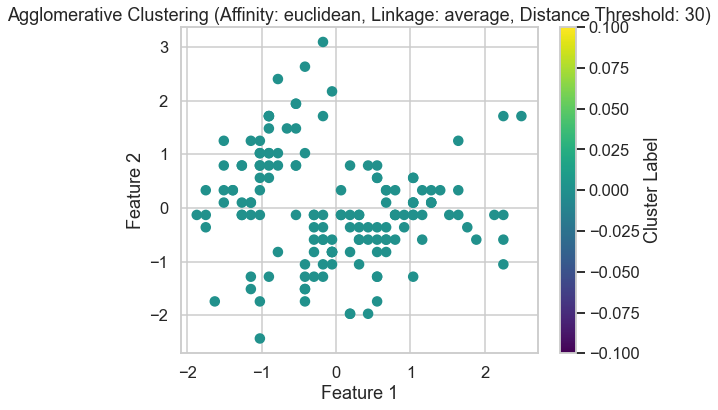

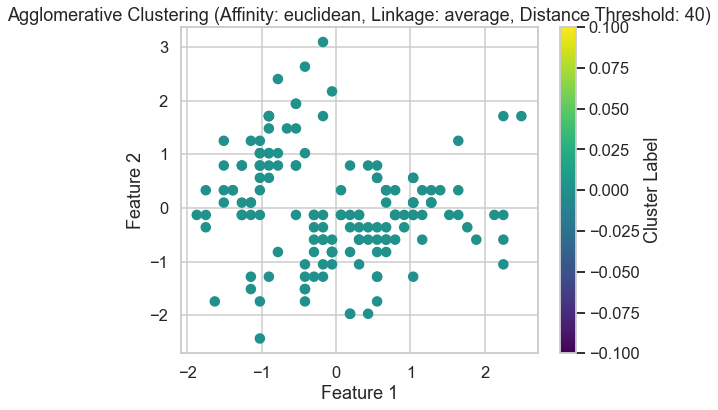

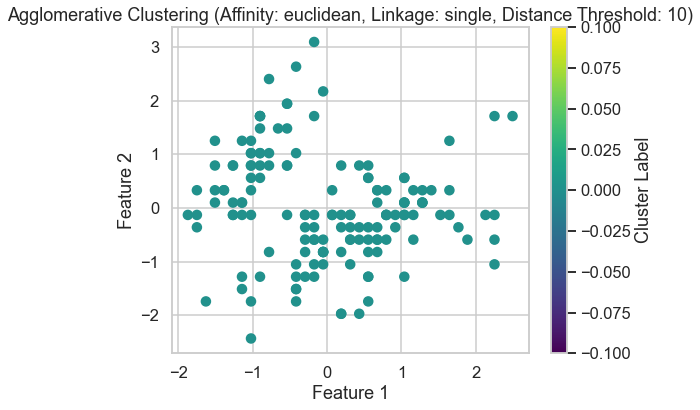

...

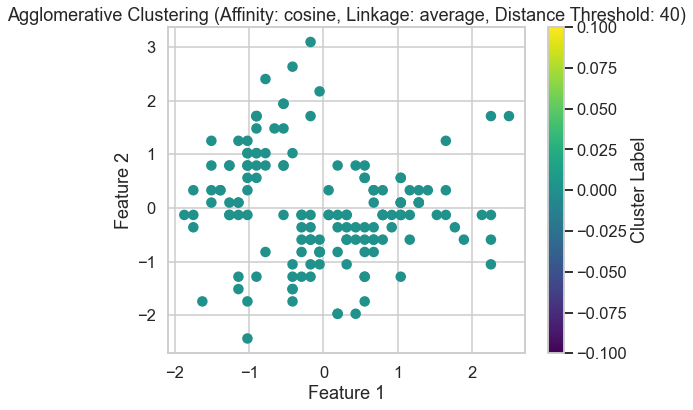

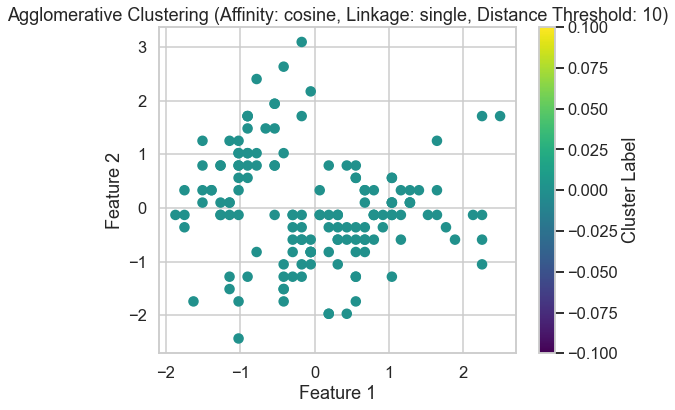

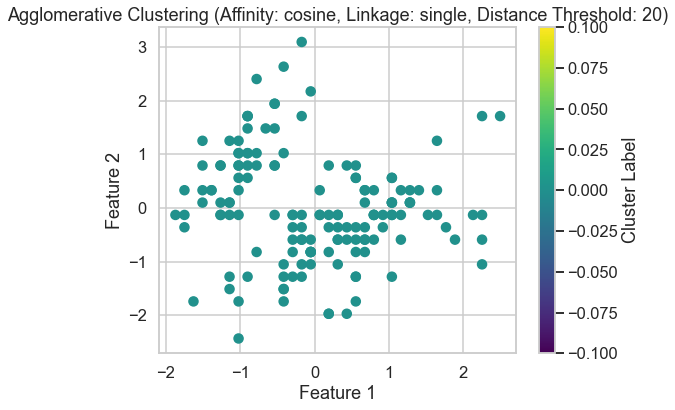

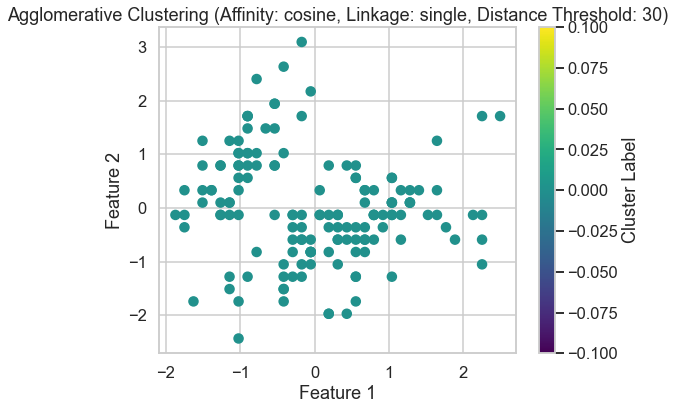

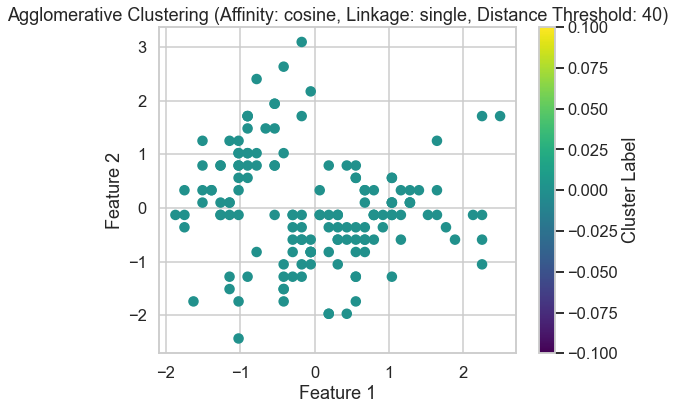

In [31]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20,30,40]  

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(X_normalized)

            # Plot the clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=cluster_labels, cmap='viridis')
            plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.colorbar(label='Cluster Label')
            plt.show()


In [32]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(X_normalized)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
            
                # Plot the dendrogram
                plt.figure(figsize=(12, 6))
                dendrogram = sch.dendrogram(sch.linkage(X_normalized, method=linkage), truncate_mode='level', p=3)
                plt.title(f'Dendrogram (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Sample Index')
                plt.ylabel('Distance')
                plt.show()
                
                # Calculate silhouette score
                silhouette_avg = silhouette_score(X_normalized, cluster_labels)
                print(f'Silhouette Score: {silhouette_avg}')
                
                # Plot the clusters
                plt.figure(figsize=(8, 6))
                plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=cluster_labels, cmap='viridis')
                plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Feature 1')
                plt.ylabel('Feature 2')
                plt.colorbar(label='Cluster Label')
                plt.show()
            else:
                print(f'Number of clusters formed is less than 2 for parameters: Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold}')


Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 40
Number of clusters formed is less than 2 for paramet

In [33]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(X_normalized)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
                # Calculate silhouette score
                silhouette_avg = silhouette_score(X_normalized, cluster_labels)
                
                # Check if silhouette score is better than current best
                if silhouette_avg > best_silhouette_score:
                    best_silhouette_score = silhouette_avg
                    best_params = {'affinity': affinity, 'linkage': linkage, 'distance_threshold': distance_threshold}
                
# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: -inf
Best Parameters: {}


DBSCAN

In [34]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Define different values for parameters
eps_values = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
min_samples_values = [5, 10, 15, 20, 25]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(X_normalized)
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(X_normalized, cluster_labels)
            
            # Check if silhouette score is better than current best
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params = {'eps': eps, 'min_samples': min_samples}

# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: 0.4356340219699649
Best Parameters: {'eps': 1.0, 'min_samples': 15}


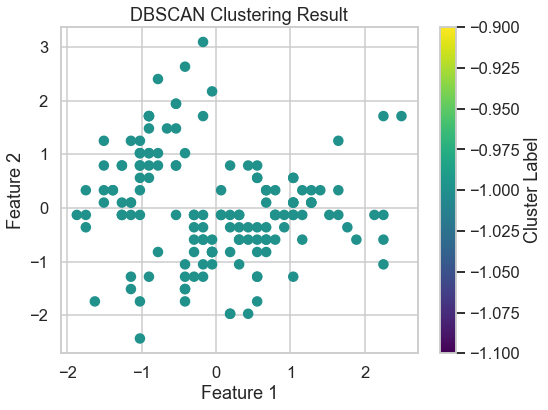

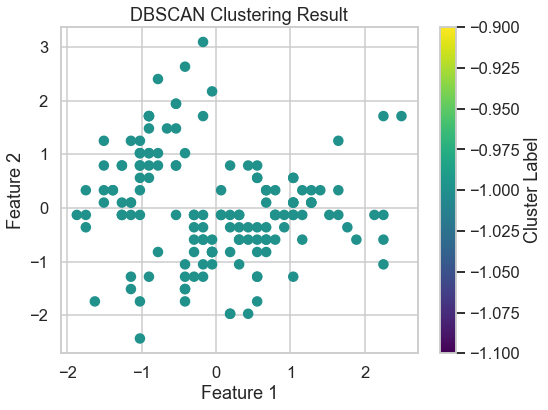

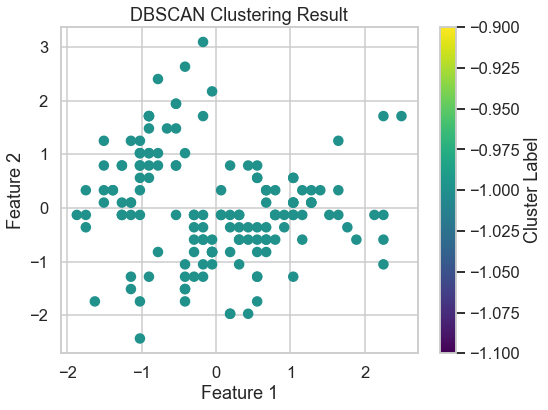

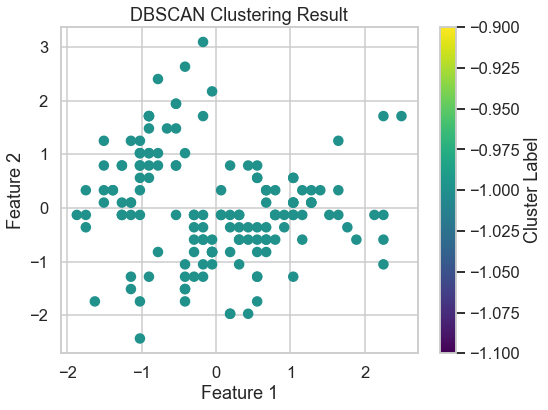

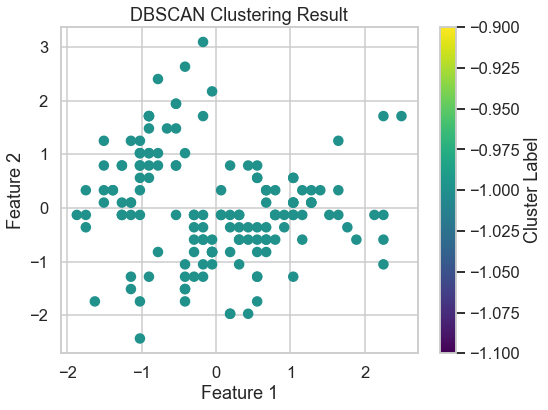

...

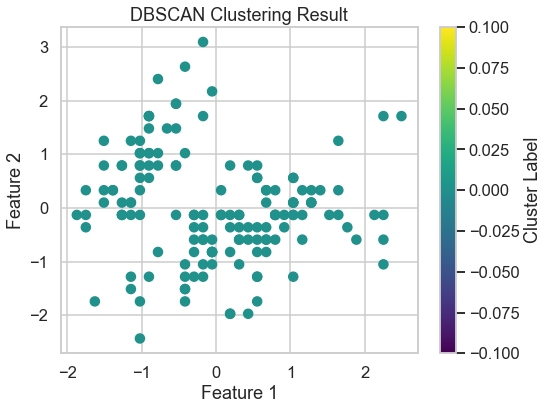

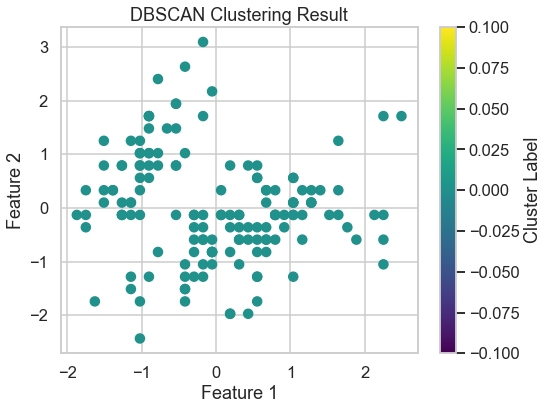

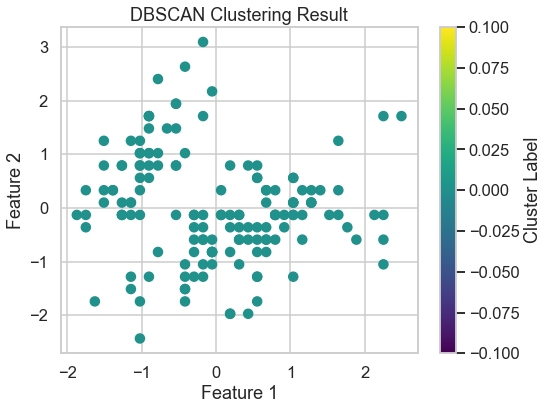

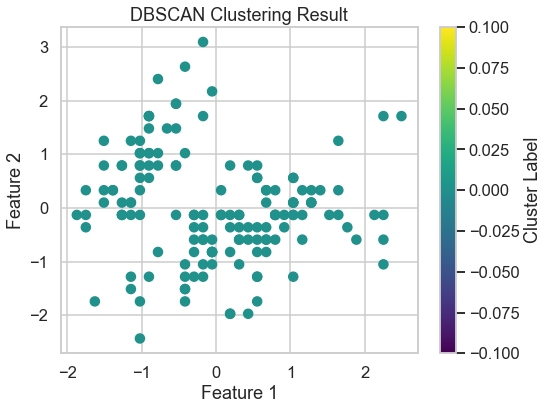

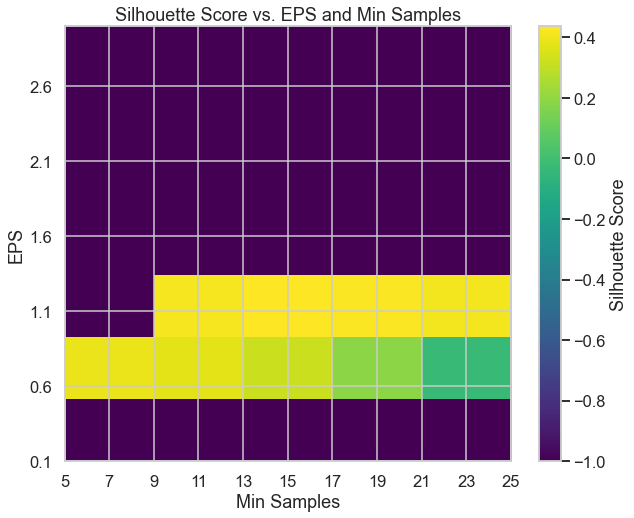

Best EPS: 1.0
Best Min Samples: 15


In [35]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Define different values for parameters
eps_values =  [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0] 
min_samples_values = [5, 10, 15, 20, 25]  

# Initialize lists to store silhouette scores
silhouette_scores = []
best_eps = None
best_min_samples = None
best_silhouette_score = float('-inf')

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(X_normalized)
        
        # Plot the resulting clusters
        plt.figure(figsize=(8, 6))
        plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=cluster_labels, cmap='viridis')
        plt.title('DBSCAN Clustering Result')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.colorbar(label='Cluster Label')
        plt.show()
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(X_normalized, cluster_labels)
            silhouette_scores.append(silhouette_avg)
            
            # Update best silhouette score and corresponding parameters
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
        else:
            # Assign default value if only one cluster is formed
            silhouette_scores.append(-1)

# Reshape silhouette scores into a 2D array for plotting
silhouette_scores = np.array(silhouette_scores).reshape(len(eps_values), len(min_samples_values))

# Plot silhouette scores
plt.figure(figsize=(10, 8))
plt.imshow(silhouette_scores, cmap='viridis', origin='lower', extent=[5, 25, 0.1, 3.0], aspect='auto')
plt.colorbar(label='Silhouette Score')
plt.xlabel('Min Samples')
plt.ylabel('EPS')
plt.title('Silhouette Score vs. EPS and Min Samples')
plt.xticks(range(5, 26, 2))
plt.yticks(np.arange(0.1, 3.1, 0.5))
plt.grid(visible=True)
plt.show()



# Print the best values of eps and min_samples
print(f'Best EPS: {best_eps}')
print(f'Best Min Samples: {best_min_samples}')


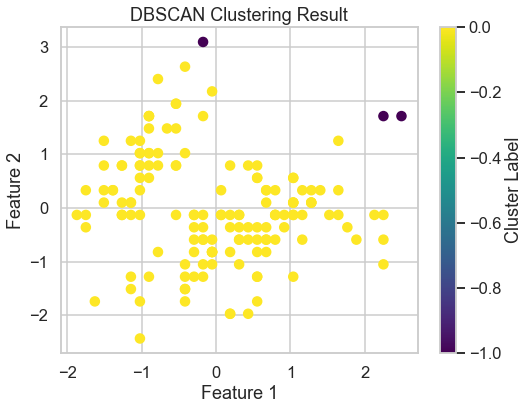

In [36]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Perform DBSCAN clustering with the best parameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan.fit_predict(X_normalized)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=cluster_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


GAUSSIAN MIXTURE 

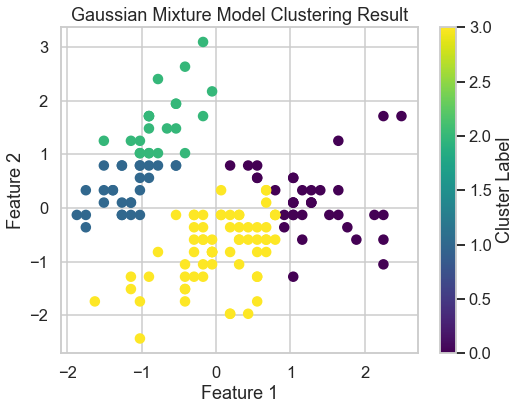

In [37]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Define the number of clusters
n_clusters = 4  # You can change this as needed

# Fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
cluster_labels = gmm.fit_predict(X_normalized)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=cluster_labels, cmap='viridis')
plt.title('Gaussian Mixture Model Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


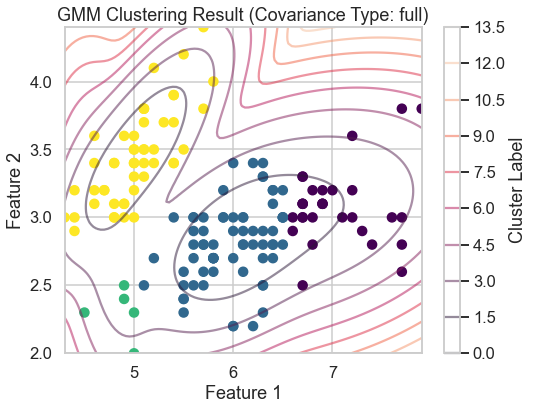

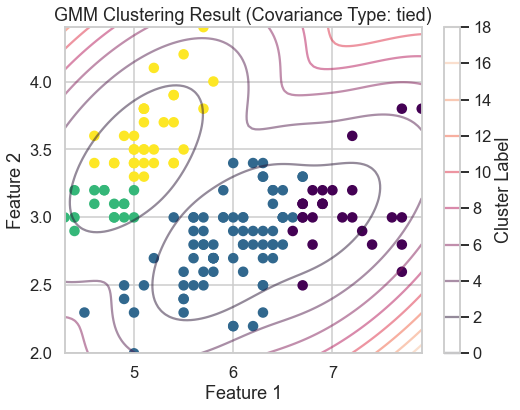

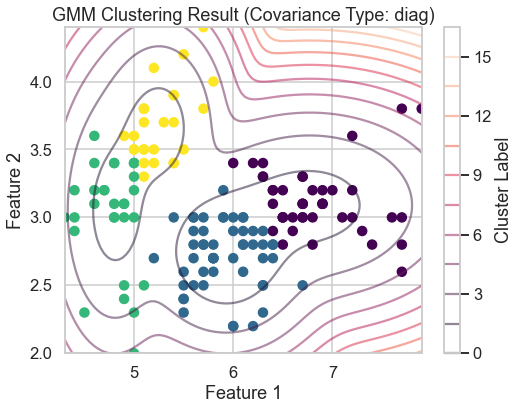

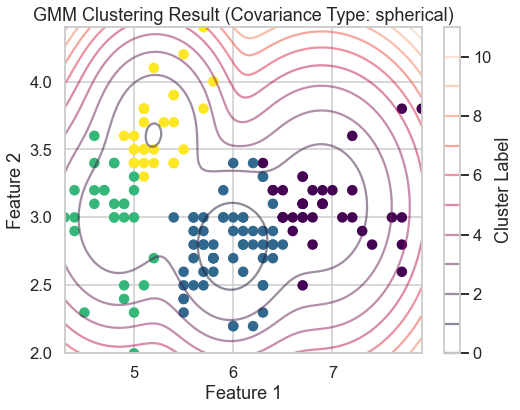

In [38]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import load_iris
import numpy as np
import matplotlib.pyplot as plt

# Load the Iris dataset
iris_data = load_iris()
X_normalized = iris_data.data[:, :2]  # Selecting only the first two features for visualization

# Define the number of clusters
n_clusters = 4  # Number of clusters in the Iris dataset

# Define different covariance types
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Plot the resulting clusters for each covariance type
for covariance_type in covariance_types:
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, random_state=42)
    cluster_labels = gmm.fit_predict(X_normalized)
    
    # Plot the resulting clusters with probability density contours
    plt.figure(figsize=(8, 6))
    plt.title(f'GMM Clustering Result (Covariance Type: {covariance_type})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    
    # Plot data points
    plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=cluster_labels, cmap='viridis')
    
    # Plot probability density contours
    x = np.linspace(np.min(X_normalized[:, 0]), np.max(X_normalized[:, 0]), 100)
    y = np.linspace(np.min(X_normalized[:, 1]), np.max(X_normalized[:, 1]), 100)
    X_mesh, Y_mesh = np.meshgrid(x, y)
    XX = np.array([X_mesh.ravel(), Y_mesh.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X_mesh.shape)
    plt.contour(X_mesh, Y_mesh, Z, levels=10, alpha=0.5)

    plt.colorbar(label='Cluster Label')
    plt.show()


## Customer dataset
Repeat all the above on the customer data set 

In [39]:
import pandas as pd
df= pd.read_csv(r"C:\Users\yomna\Downloads\Customer_data.csv")
df.dropna()
print(df.head(10))
print(df.columns)



          ID  Sex  Marital status  Age  Education  Income  Occupation  \
0  100000001    0               0   67          2  124670           1   
1  100000002    1               1   22          1  150773           1   
2  100000003    0               0   49          1   89210           0   
3  100000004    0               0   45          1  171565           1   
4  100000005    0               0   53          1  149031           1   
5  100000006    0               0   35          1  144848           0   
6  100000007    0               0   53          1  156495           1   
7  100000008    0               0   35          1  193621           2   
8  100000009    0               1   61          2  151591           0   
9  100000010    0               1   28          1  174646           2   

   Settlement size  
0                2  
1                2  
2                0  
3                1  
4                1  
5                0  
6                1  
7                1  
8      

In [40]:
# Assuming 'df' is your DataFrame with the data
correlation_matrix = df.corr()
print(correlation_matrix)

                       ID       Sex  Marital status       Age  Education  \
ID               1.000000  0.328262        0.074403 -0.085246   0.012543   
Sex              0.328262  1.000000        0.566511 -0.182885   0.244838   
Marital status   0.074403  0.566511        1.000000 -0.213178   0.374017   
Age             -0.085246 -0.182885       -0.213178  1.000000   0.654605   
Education        0.012543  0.244838        0.374017  0.654605   1.000000   
Income          -0.303217 -0.195146       -0.073528  0.340610   0.233459   
Occupation      -0.291958 -0.202491       -0.029490  0.108388   0.064524   
Settlement size -0.378445 -0.300803       -0.097041  0.119751   0.034732   

                   Income  Occupation  Settlement size  
ID              -0.303217   -0.291958        -0.378445  
Sex             -0.195146   -0.202491        -0.300803  
Marital status  -0.073528   -0.029490        -0.097041  
Age              0.340610    0.108388         0.119751  
Education        0.233459    0

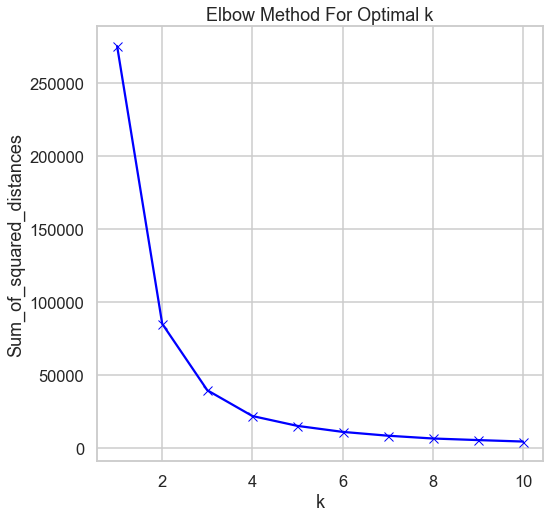

Best number of clusters (k): 3


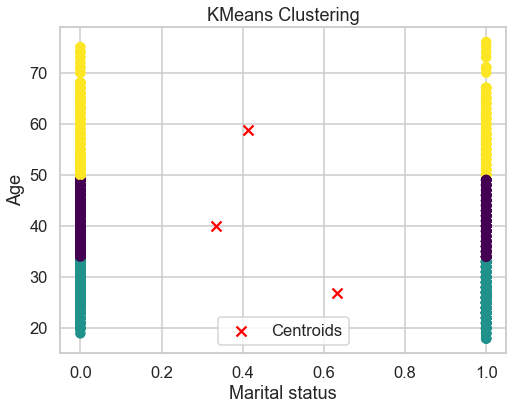

In [41]:
from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cdist
from kneed import KneeLocator

# Assuming 'df' is your DataFrame with the data

# Extracting the selected features
dataa = df[['Marital status', 'Age']].values

# Calculate inertia for different values of k
inertia = []
K = range(1, 11)
for k in K:
    km = KMeans(n_clusters=k, random_state=42, max_iter=50)
    km.fit(dataa)
    inertia.append(km.inertia_)

# Plotting the inertia result to find the elbow
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

# Finding the elbow using kneed locator
kl = KneeLocator(range(1, 11), inertia, curve="convex", direction="decreasing")
best_cluster = kl.elbow
print("Best number of clusters (k):", best_cluster)

# Fit KMeans clustering model with the best k
kmeans = KMeans(n_clusters=best_cluster, random_state=42)
kmeans.fit(dataa)

# Get cluster labels
cluster_labels = kmeans.labels_

# Plotting the clusters
plt.figure(figsize=(8, 6))
plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=100, c='red', label='Centroids')
plt.title('KMeans Clustering')
plt.xlabel('Marital status')
plt.ylabel('Age')
plt.legend()
plt.show()


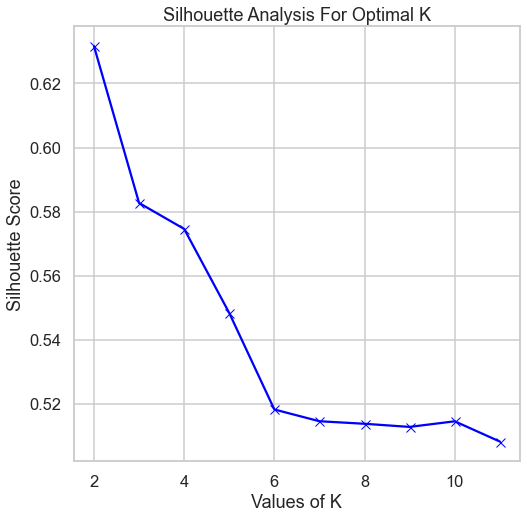

Best K value: 2
Best Silhouette Score: 0.6316507658313164


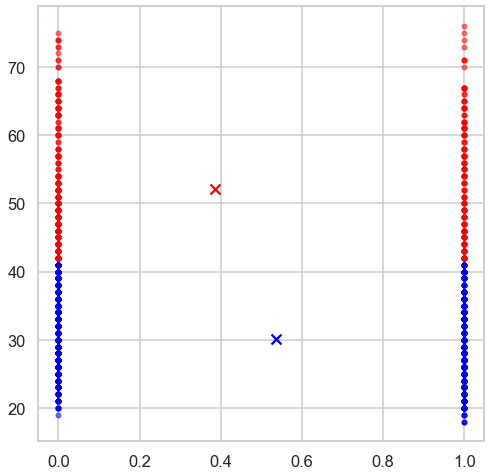

In [42]:
from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
silhouette_avg = []
best_k = None
best_silhouette_score = -1  # Initialize with a low value

for num_clusters in range_n_clusters:
    # Initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,random_state=42,max_iter=50)
    kmeans.fit(dataa)
    cluster_labels = kmeans.labels_

    # Compute silhouette score
    silhouette_avg.append(silhouette_score(dataa, cluster_labels))

    # Check if current silhouette score is the highest so far
    if silhouette_avg[-1] > best_silhouette_score:
        best_silhouette_score = silhouette_avg[-1]
        best_k = num_clusters

plt.plot(range_n_clusters, silhouette_avg, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis For Optimal K')
plt.show()

print("Best K value:", best_k)
print("Best Silhouette Score:", best_silhouette_score)

#Displaying the best cluster
km_neww= KMeans(n_clusters= best_k)
km_neww.fit(dataa)
display_cluster(dataa, km_neww, best_k)


hierarchical clustering

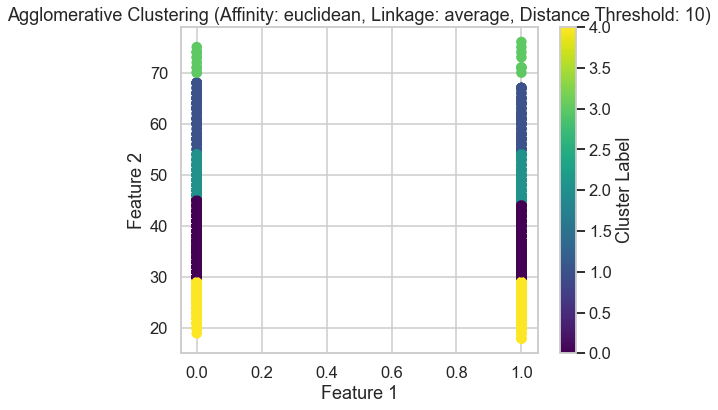

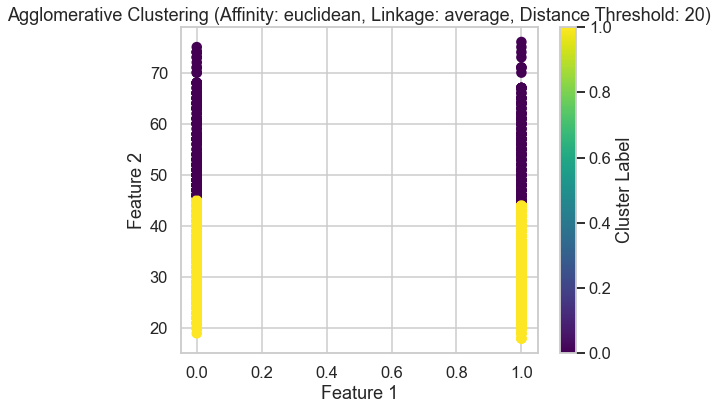

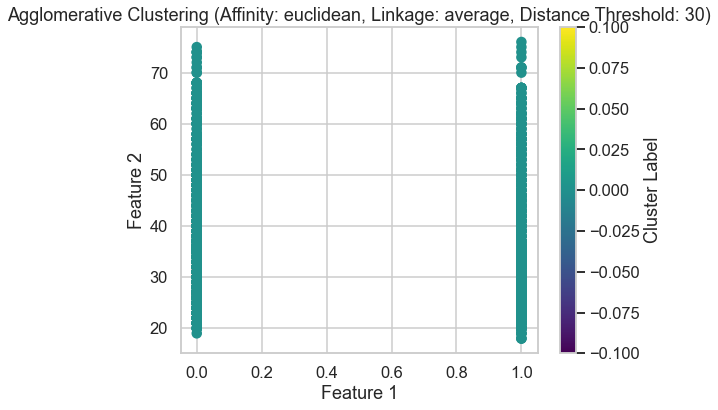

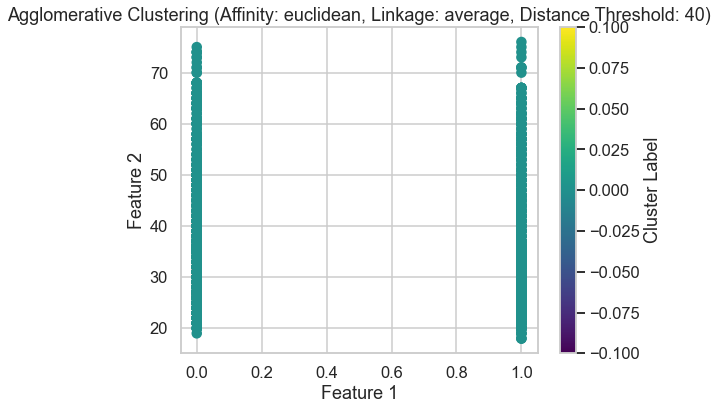

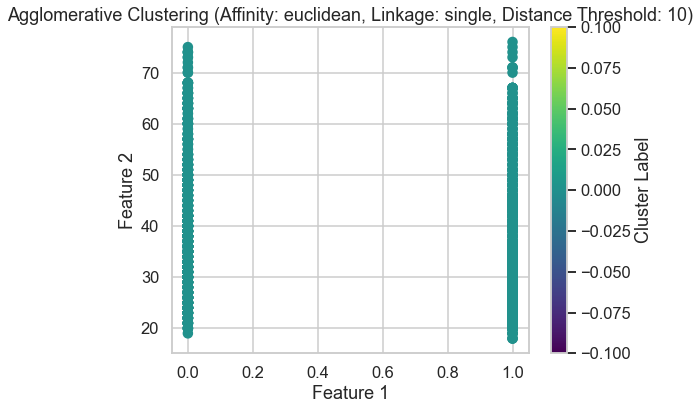

...

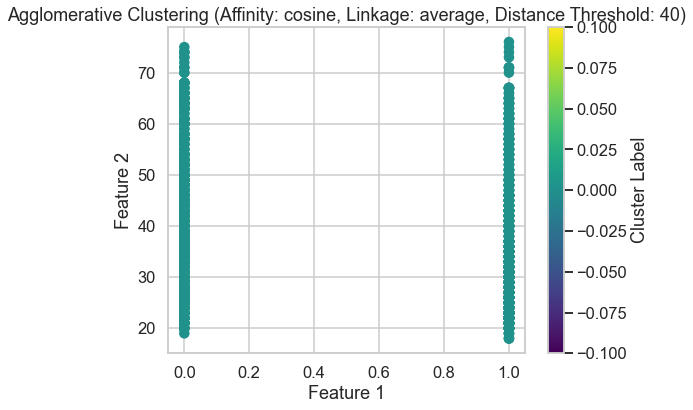

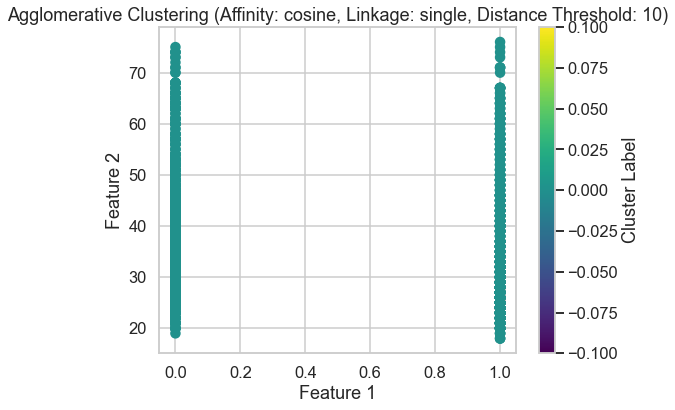

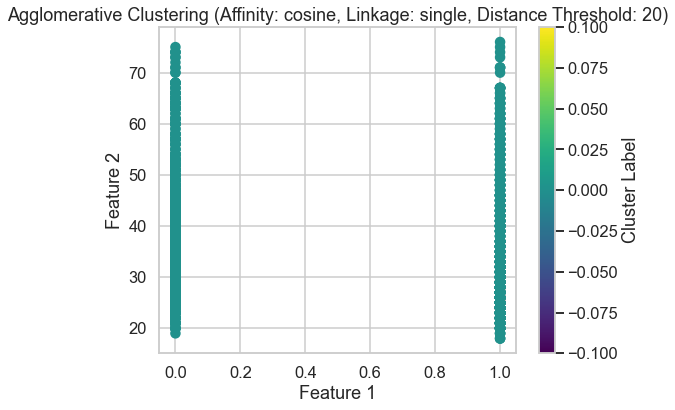

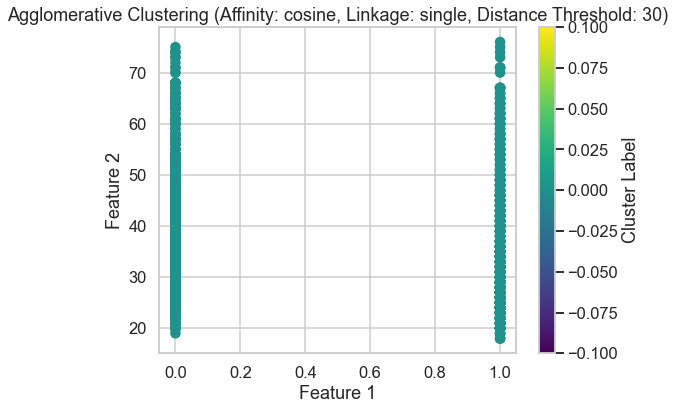

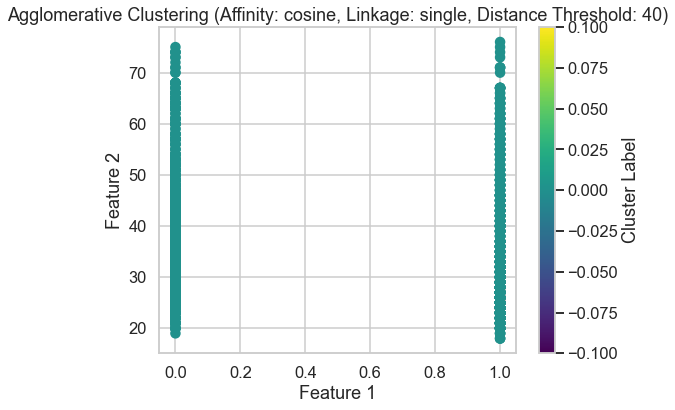

In [43]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20,30,40]  

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(dataa)

            # Plot the clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
            plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
            plt.xlabel('Feature 1')
            plt.ylabel('Feature 2')
            plt.colorbar(label='Cluster Label')
            plt.show()


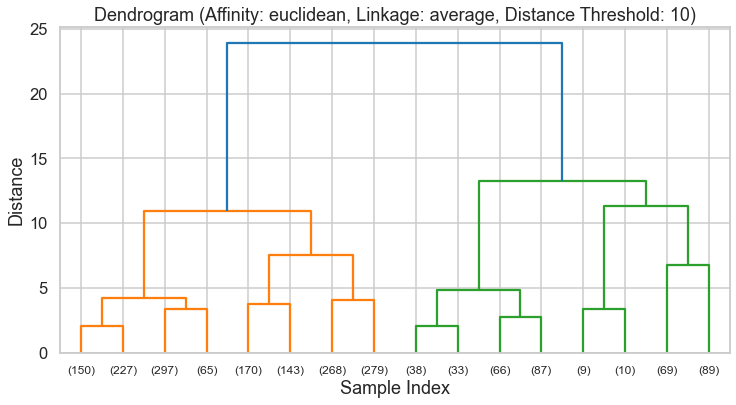

Silhouette Score: 0.5191158302825517


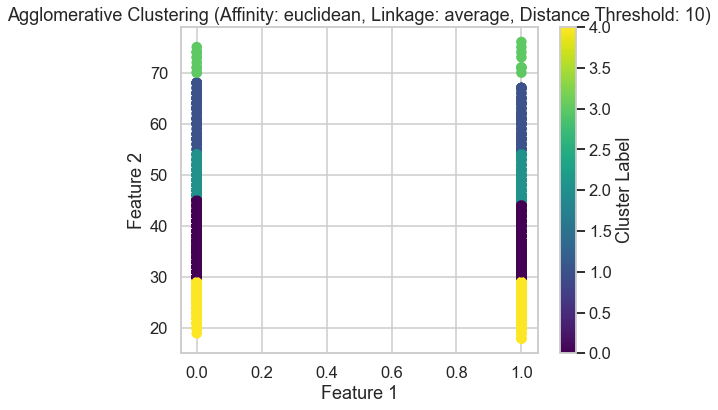

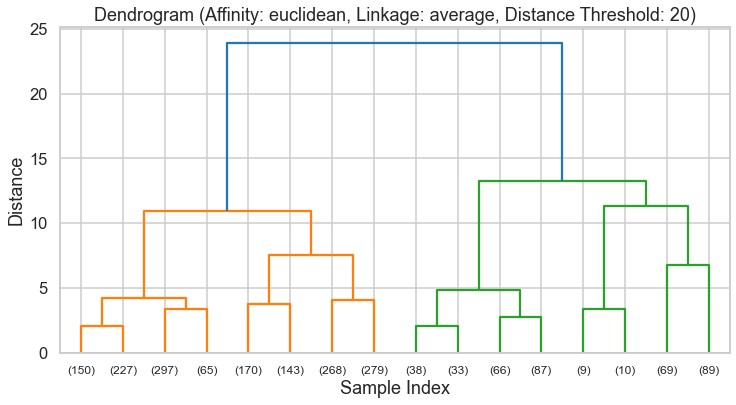

Silhouette Score: 0.6325095389847956


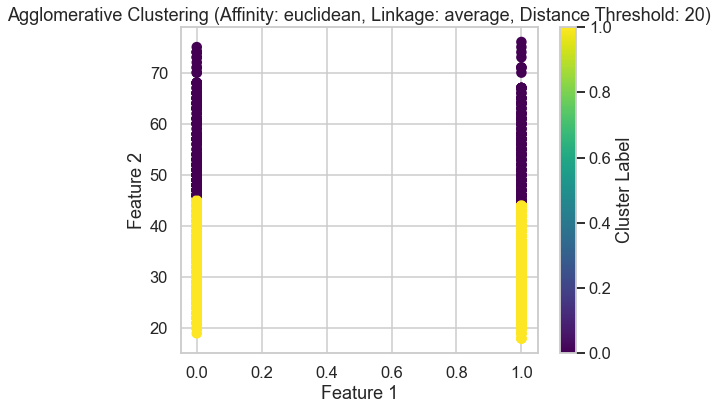

Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: euclidean, Linkage: single, Distance Threshold: 40


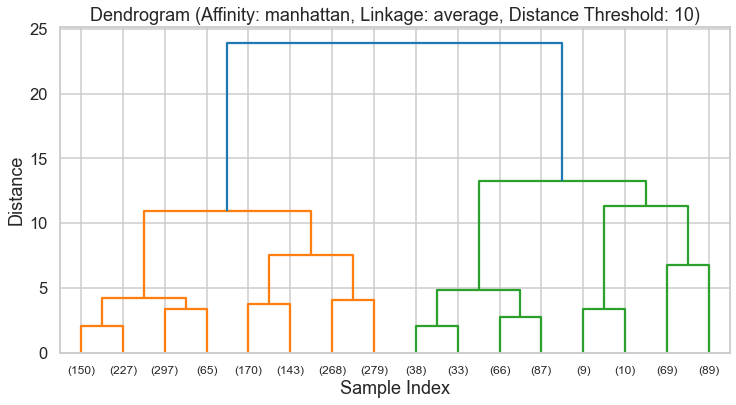

Silhouette Score: 0.5399606694187601


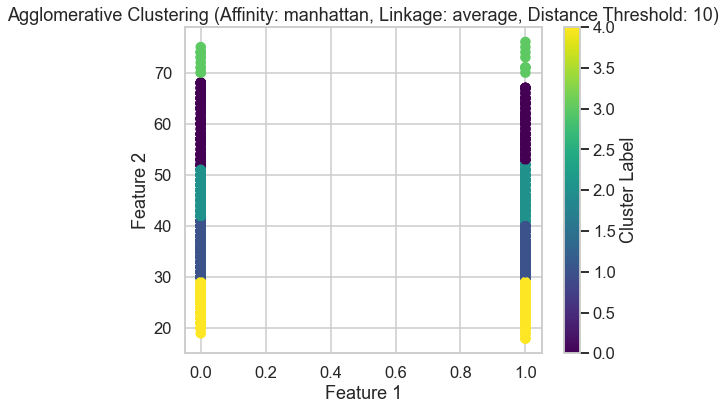

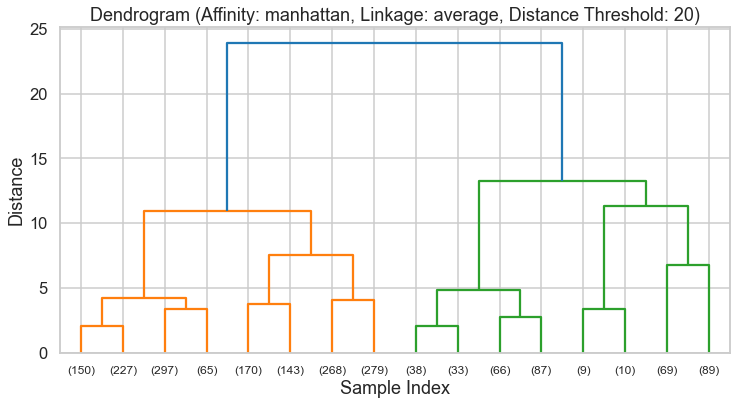

Silhouette Score: 0.6300074255363501


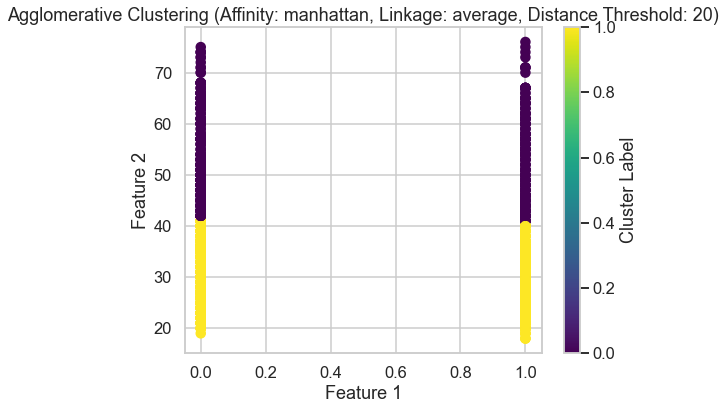

Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: average, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 30
Number of clusters formed is less than 2 for parameters: Affinity: manhattan, Linkage: single, Distance Threshold: 40
Number of clusters formed is less than 2 for parameters: Affinity: cosine, Linkage: average, Distance Threshold: 10
Number of clusters formed is less than 2 for parameters: Affinity: cosine, Linkage: average, Distance Threshold: 20
Number of clusters formed is less than 2 for parameters: A

In [44]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(dataa)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
            
                # Plot the dendrogram
                plt.figure(figsize=(12, 6))
                dendrogram = sch.dendrogram(sch.linkage(dataa, method=linkage), truncate_mode='level', p=3)
                plt.title(f'Dendrogram (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Sample Index')
                plt.ylabel('Distance')
                plt.show()
                
                # Calculate silhouette score
                silhouette_avg = silhouette_score(dataa, cluster_labels)
                print(f'Silhouette Score: {silhouette_avg}')
                
                # Plot the clusters
                plt.figure(figsize=(8, 6))
                plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
                plt.title(f'Agglomerative Clustering (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
                plt.xlabel('Feature 1')
                plt.ylabel('Feature 2')
                plt.colorbar(label='Cluster Label')
                plt.show()
            else:
                print(f'Number of clusters formed is less than 2 for parameters: Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold}')


In [45]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch


# Define different values for parameters
affinity_values = ['euclidean', 'manhattan', 'cosine']
linkage_values = ['average', 'single']
distance_threshold_values = [10, 20, 30, 40]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for affinity in affinity_values:
    for linkage in linkage_values:
        for distance_threshold in distance_threshold_values:
            
            # Perform agglomerative clustering
            agglomerative = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            cluster_labels = agglomerative.fit_predict(dataa)
            
            # Check if more than one cluster is formed
            if len(set(cluster_labels)) > 1:
                # Calculate silhouette score
                silhouette_avg = silhouette_score(dataa, cluster_labels)
                
                # Check if silhouette score is better than current best
                if silhouette_avg > best_silhouette_score:
                    best_silhouette_score = silhouette_avg
                    best_params = {'affinity': affinity, 'linkage': linkage, 'distance_threshold': distance_threshold}
                
# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: 0.6325095389847956
Best Parameters: {'affinity': 'euclidean', 'linkage': 'average', 'distance_threshold': 20}


DBSCAN

In [46]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Define different values for parameters
eps_values = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
min_samples_values = [5, 10, 15, 20, 25]

# Initialize variables to store best silhouette score and corresponding parameters
best_silhouette_score = float('-inf')
best_params = {}

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(dataa)
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(dataa, cluster_labels)
            
            # Check if silhouette score is better than current best
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params = {'eps': eps, 'min_samples': min_samples}

# Print best silhouette score and corresponding parameters
print(f'Best Silhouette Score: {best_silhouette_score}')
print(f'Best Parameters: {best_params}')


Best Silhouette Score: 0.9507557568246244
Best Parameters: {'eps': 0.1, 'min_samples': 5}


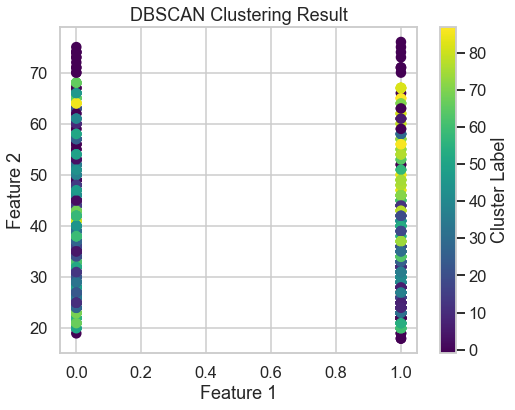

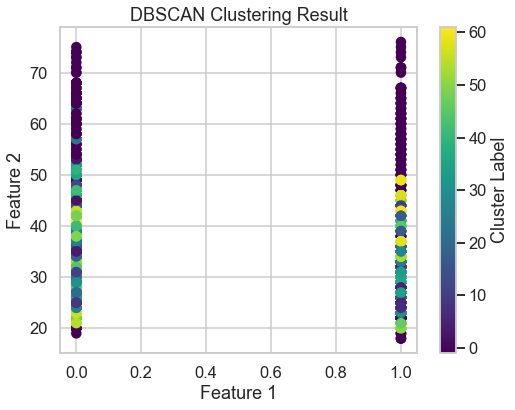

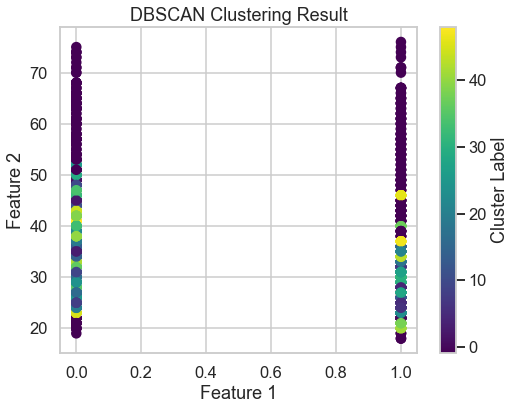

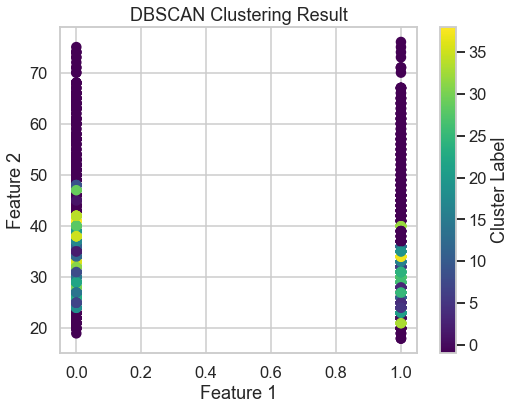

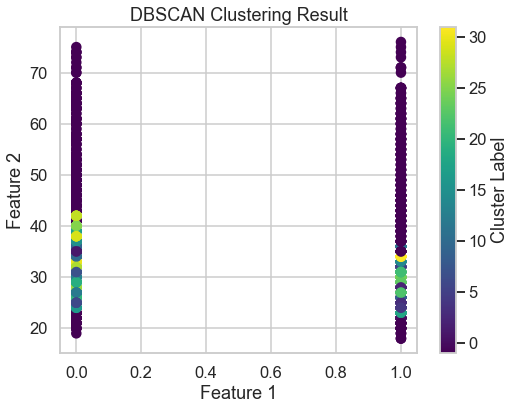

...

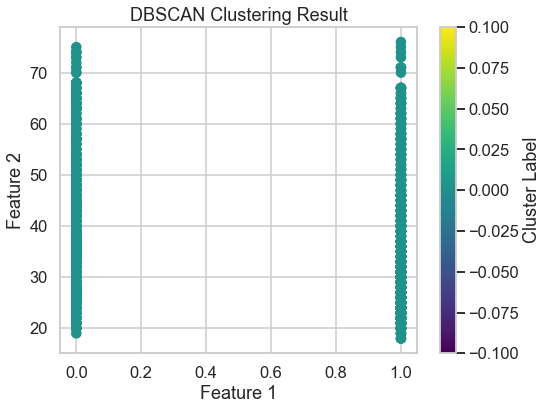

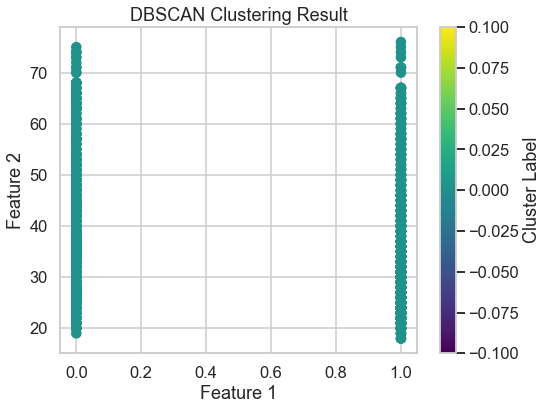

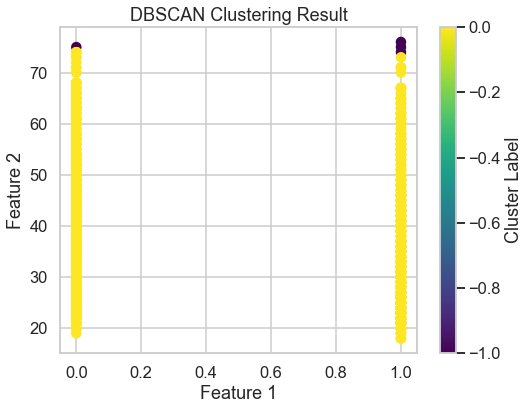

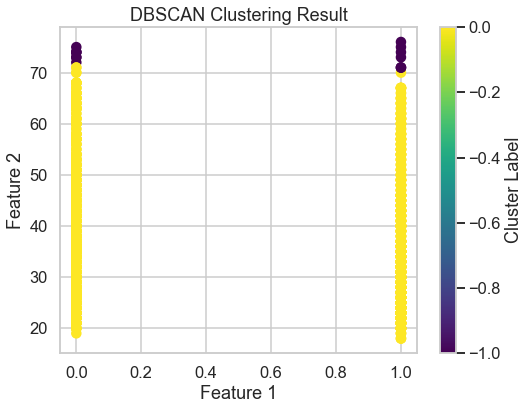

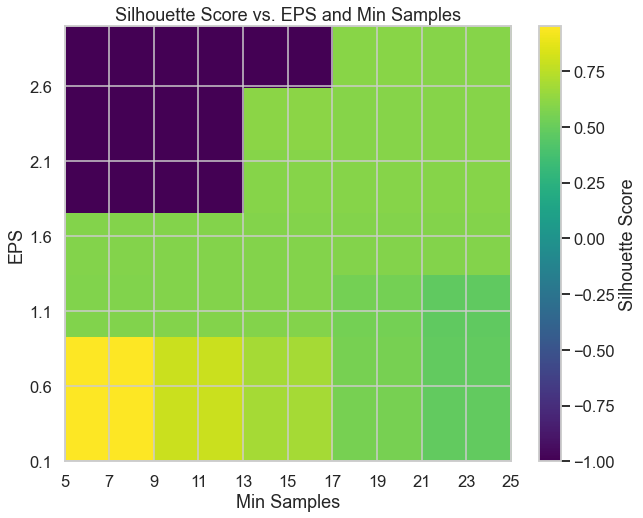

Best EPS: 0.1
Best Min Samples: 5


In [47]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Define different values for parameters
eps_values =  [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0] 
min_samples_values = [5, 10, 15, 20, 25]  

# Initialize lists to store silhouette scores
silhouette_scores = []
best_eps = None
best_min_samples = None
best_silhouette_score = float('-inf')

# Iterate over parameter combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(dataa)
        
        # Plot the resulting clusters
        plt.figure(figsize=(8, 6))
        plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
        plt.title('DBSCAN Clustering Result')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.colorbar(label='Cluster Label')
        plt.show()
        
        # Check if more than one cluster is formed
        if len(set(cluster_labels)) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(dataa, cluster_labels)
            silhouette_scores.append(silhouette_avg)
            
            # Update best silhouette score and corresponding parameters
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
        else:
            # Assign default value if only one cluster is formed
            silhouette_scores.append(-1)

# Reshape silhouette scores into a 2D array for plotting
silhouette_scores = np.array(silhouette_scores).reshape(len(eps_values), len(min_samples_values))

# Plot silhouette scores
plt.figure(figsize=(10, 8))
plt.imshow(silhouette_scores, cmap='viridis', origin='lower', extent=[5, 25, 0.1, 3.0], aspect='auto')
plt.colorbar(label='Silhouette Score')
plt.xlabel('Min Samples')
plt.ylabel('EPS')
plt.title('Silhouette Score vs. EPS and Min Samples')
plt.xticks(range(5, 26, 2))
plt.yticks(np.arange(0.1, 3.1, 0.5))
plt.grid(visible=True)
plt.show()



# Print the best values of eps and min_samples
print(f'Best EPS: {best_eps}')
print(f'Best Min Samples: {best_min_samples}')


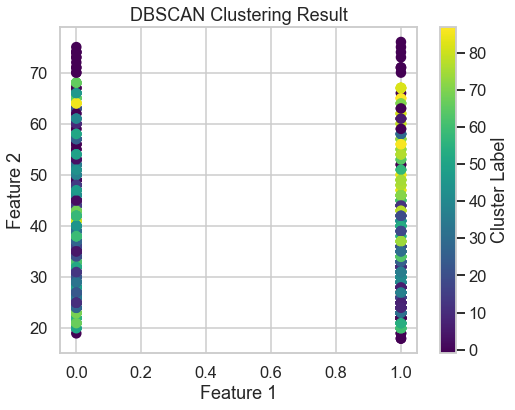

In [48]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Perform DBSCAN clustering with the best parameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan.fit_predict(dataa)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
plt.title('DBSCAN Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


GAUSSIAN MIXTURE

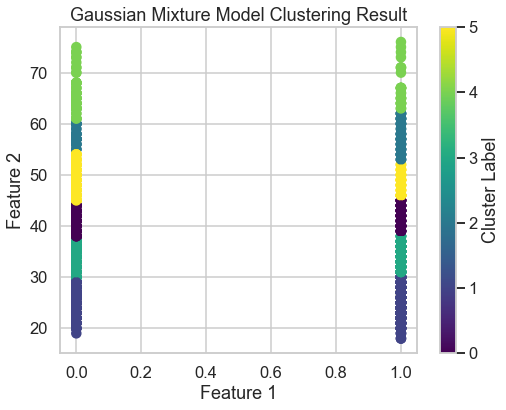

In [49]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Define the number of clusters
n_clusters = 6  # You can change this as needed

# Fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
cluster_labels = gmm.fit_predict(dataa)

# Plot the resulting clusters
plt.figure(figsize=(8, 6))
plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
plt.title('Gaussian Mixture Model Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()


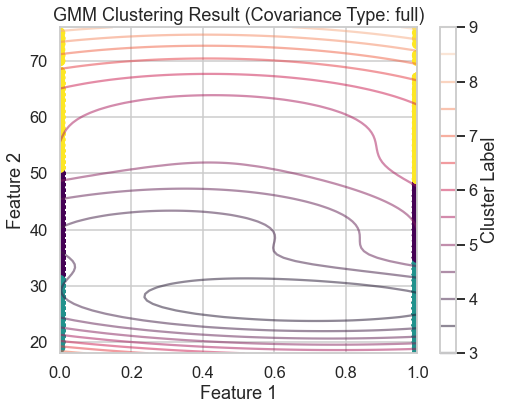

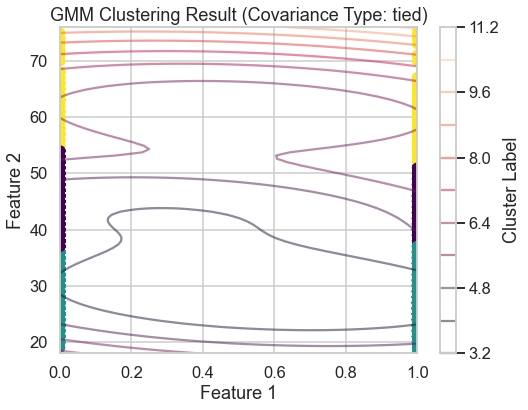

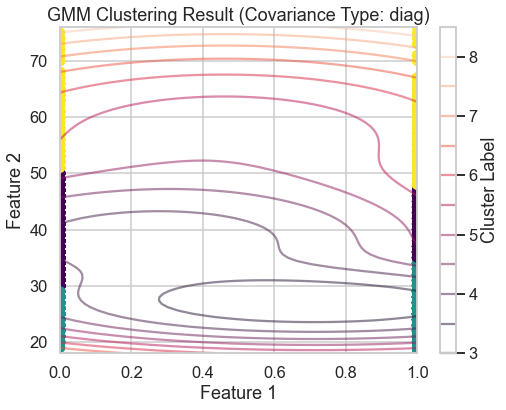

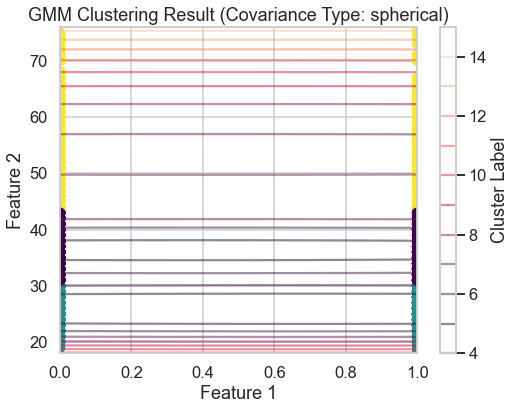

In [50]:
from sklearn.mixture import GaussianMixture
from sklearn.datasets import load_iris
import numpy as np
import matplotlib.pyplot as plt


# Define the number of clusters
n_clusters = 3  # Number of clusters in the Iris dataset

# Define different covariance types
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Plot the resulting clusters for each covariance type
for covariance_type in covariance_types:
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, random_state=42)
    cluster_labels = gmm.fit_predict(dataa)
    
    # Plot the resulting clusters with probability density contours
    plt.figure(figsize=(8, 6))
    plt.title(f'GMM Clustering Result (Covariance Type: {covariance_type})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    
    # Plot data points
    plt.scatter(dataa[:, 0], dataa[:, 1], c=cluster_labels, cmap='viridis')
    
    # Plot probability density contours
    x = np.linspace(np.min(dataa[:, 0]), np.max(dataa[:, 0]), 100)
    y = np.linspace(np.min(dataa[:, 1]), np.max(dataa[:, 1]), 100)
    X_mesh, Y_mesh = np.meshgrid(x, y)
    XX = np.array([X_mesh.ravel(), Y_mesh.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X_mesh.shape)
    plt.contour(X_mesh, Y_mesh, Z, levels=10, alpha=0.5)

    plt.colorbar(label='Cluster Label')
    plt.show()
